In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=3 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 3.000e+00   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 28083 
    Total predicted counts          : 28232.96
    Total off counts                : 101447.00

    Total background counts         : 20289.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 38.8 s, sys: 204 ms, total: 39 s
Wall time: 39 s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 28089 
    Total predicted counts          : 28333.76
    Total off counts                : 101951.00

    Total background counts         : 20390.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 27989 
    Total predicted counts          : 28399.36
    Total off counts                : 102279.00

    Total background counts         : 20

SpectrumDatasetOnOff

    Name                            : obs_18 

    Total counts                    : 28341 
    Total predicted counts          : 28276.16
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_19 

    Total counts                    : 27950 
    Total predicted counts          : 28149.96
    Total off counts                : 101032.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_43 

    Total counts                    : 27914 
    Total predicted counts          : 28287.36
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_44 

    Total counts                    : 28399 
    Total predicted counts          : 28142.16
    Total off counts                : 100993.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_72 

    Total counts                    : 28164 
    Total predicted counts          : 28278.56
    Total off counts                : 101675.00

    Total background counts         : 20335.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_73 

    Total counts                    : 28220 
    Total predicted counts          : 28152.76
    Total off counts                : 101046.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_103 

    Total counts                    : 28238 
    Total predicted counts          : 28253.96
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_104 

    Total counts                    : 28090 
    Total predicted counts          : 28252.56
    Total off counts                : 101545.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_128 

    Total counts                    : 28188 
    Total predicted counts          : 28106.76
    Total off counts                : 100816.00

    Total background counts         : 20163.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_129 

    Total counts                    : 28496 
    Total predicted counts          : 28264.76
    Total off counts                : 101606.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_153 

    Total counts                    : 28196 
    Total predicted counts          : 28207.96
    Total off counts                : 101322.00

    Total background counts         : 20264.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_154 

    Total counts                    : 28587 
    Total predicted counts          : 28288.96
    Total off counts                : 101727.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_181 

    Total counts                    : 28333 
    Total predicted counts          : 28299.56
    Total off counts                : 101780.00

    Total background counts         : 20356.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_182 

    Total counts                    : 28447 
    Total predicted counts          : 28435.56
    Total off counts                : 102460.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_207 

    Total counts                    : 28317 
    Total predicted counts          : 28386.36
    Total off counts                : 102214.00

    Total background counts         : 20442.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_208 

    Total counts                    : 27997 
    Total predicted counts          : 28331.36
    Total off counts                : 101939.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_232 

    Total counts                    : 28277 
    Total predicted counts          : 28175.96
    Total off counts                : 101162.00

    Total background counts         : 20232.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_233 

    Total counts                    : 28240 
    Total predicted counts          : 28260.16
    Total off counts                : 101583.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_260 

    Total counts                    : 28022 
    Total predicted counts          : 28298.96
    Total off counts                : 101777.00

    Total background counts         : 20355.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_261 

    Total counts                    : 28196 
    Total predicted counts          : 28154.16
    Total off counts                : 101053.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_293 

    Total counts                    : 28455 
    Total predicted counts          : 28284.96
    Total off counts                : 101707.00

    Total background counts         : 20341.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_294 

    Total counts                    : 28298 
    Total predicted counts          : 28258.16
    Total off counts                : 101573.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_321 

    Total counts                    : 28239 
    Total predicted counts          : 28403.56
    Total off counts                : 102300.00

    Total background counts         : 20460.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_322 

    Total counts                    : 28205 
    Total predicted counts          : 28164.96
    Total off counts                : 101107.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_351 

    Total counts                    : 28387 
    Total predicted counts          : 28196.76
    Total off counts                : 101266.00

    Total background counts         : 20253.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_352 

    Total counts                    : 28256 
    Total predicted counts          : 28143.56
    Total off counts                : 101000.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_383 

    Total counts                    : 28436 
    Total predicted counts          : 28301.76
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_384 

    Total counts                    : 28250 
    Total predicted counts          : 28196.36
    Total off counts                : 101264.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_411 

    Total counts                    : 28466 
    Total predicted counts          : 28359.96
    Total off counts                : 102082.00

    Total background counts         : 20416.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_412 

    Total counts                    : 28202 
    Total predicted counts          : 28169.56
    Total off counts                : 101130.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_431 

    Total counts                    : 28154 
    Total predicted counts          : 28210.16
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_432 

    Total counts                    : 28392 
    Total predicted counts          : 28349.96
    Total off counts                : 102032.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_449 

    Total counts                    : 28342 
    Total predicted counts          : 28238.16
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_450 

    Total counts                    : 28397 
    Total predicted counts          : 28285.96
    Total off counts                : 101712.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_470 

    Total counts                    : 28244 
    Total predicted counts          : 28191.16
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_471 

    Total counts                    : 28308 
    Total predicted counts          : 28281.76
    Total off counts                : 101691.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_489 

    Total counts                    : 28356 
    Total predicted counts          : 28261.56
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_490 

    Total counts                    : 28342 
    Total predicted counts          : 28107.56
    Total off counts                : 100820.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_509 

    Total counts                    : 28223 
    Total predicted counts          : 28247.76
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_510 

    Total counts                    : 28241 
    Total predicted counts          : 28313.36
    Total off counts                : 101849.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_530 

    Total counts                    : 28152 
    Total predicted counts          : 28250.56
    Total off counts                : 101535.00

    Total background counts         : 20307.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_531 

    Total counts                    : 28407 
    Total predicted counts          : 28234.56
    Total off counts                : 101455.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_550 

    Total counts                    : 27922 
    Total predicted counts          : 28255.76
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_551 

    Total counts                    : 28344 
    Total predicted counts          : 28276.96
    Total off counts                : 101667.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_570 

    Total counts                    : 28620 
    Total predicted counts          : 28278.36
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_571 

    Total counts                    : 28191 
    Total predicted counts          : 28296.76
    Total off counts                : 101766.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_589 

    Total counts                    : 28341 
    Total predicted counts          : 28258.76
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_590 

    Total counts                    : 28579 
    Total predicted counts          : 28246.36
    Total off counts                : 101514.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_610 

    Total counts                    : 28012 
    Total predicted counts          : 28235.16
    Total off counts                : 101458.00

    Total background counts         : 20291.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_611 

    Total counts                    : 28304 
    Total predicted counts          : 28229.56
    Total off counts                : 101430.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_636 

    Total counts                    : 28178 
    Total predicted counts          : 28208.76
    Total off counts                : 101326.00

    Total background counts         : 20265.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_637 

    Total counts                    : 28194 
    Total predicted counts          : 28283.96
    Total off counts                : 101702.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_664 

    Total counts                    : 28197 
    Total predicted counts          : 28250.76
    Total off counts                : 101536.00

    Total background counts         : 20307.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_665 

    Total counts                    : 28104 
    Total predicted counts          : 28280.96
    Total off counts                : 101687.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_688 

    Total counts                    : 28315 
    Total predicted counts          : 28229.36
    Total off counts                : 101429.00

    Total background counts         : 20285.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_689 

    Total counts                    : 28169 
    Total predicted counts          : 28245.76
    Total off counts                : 101511.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_713 

    Total counts                    : 28340 
    Total predicted counts          : 28219.36
    Total off counts                : 101379.00

    Total background counts         : 20275.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_714 

    Total counts                    : 27906 
    Total predicted counts          : 28249.96
    Total off counts                : 101532.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_736 

    Total counts                    : 28259 
    Total predicted counts          : 28238.16
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_737 

    Total counts                    : 28081 
    Total predicted counts          : 28259.76
    Total off counts                : 101581.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_758 

    Total counts                    : 27986 
    Total predicted counts          : 28201.76
    Total off counts                : 101291.00

    Total background counts         : 20258.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_759 

    Total counts                    : 28388 
    Total predicted counts          : 28128.36
    Total off counts                : 100924.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_778 

    Total counts                    : 28130 
    Total predicted counts          : 28136.56
    Total off counts                : 100965.00

    Total background counts         : 20193.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_779 

    Total counts                    : 28440 
    Total predicted counts          : 28269.16
    Total off counts                : 101628.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_797 

    Total counts                    : 28134 
    Total predicted counts          : 28219.36
    Total off counts                : 101379.00

    Total background counts         : 20275.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_798 

    Total counts                    : 28321 
    Total predicted counts          : 28270.16
    Total off counts                : 101633.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_817 

    Total counts                    : 28283 
    Total predicted counts          : 28244.36
    Total off counts                : 101504.00

    Total background counts         : 20300.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_818 

    Total counts                    : 28066 
    Total predicted counts          : 28206.16
    Total off counts                : 101313.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_838 

    Total counts                    : 28649 
    Total predicted counts          : 28359.76
    Total off counts                : 102081.00

    Total background counts         : 20416.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_839 

    Total counts                    : 28376 
    Total predicted counts          : 28216.56
    Total off counts                : 101365.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_854 

    Total counts                    : 28308 
    Total predicted counts          : 28242.56
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_855 

    Total counts                    : 28026 
    Total predicted counts          : 28301.96
    Total off counts                : 101792.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_875 

    Total counts                    : 28281 
    Total predicted counts          : 28351.36
    Total off counts                : 102039.00

    Total background counts         : 20407.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_876 

    Total counts                    : 28147 
    Total predicted counts          : 28213.56
    Total off counts                : 101350.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_899 

    Total counts                    : 28041 
    Total predicted counts          : 28246.16
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_900 

    Total counts                    : 28249 
    Total predicted counts          : 28205.76
    Total off counts                : 101311.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_926 

    Total counts                    : 28498 
    Total predicted counts          : 28320.76
    Total off counts                : 101886.00

    Total background counts         : 20377.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_927 

    Total counts                    : 28112 
    Total predicted counts          : 28253.56
    Total off counts                : 101550.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_947 

    Total counts                    : 28150 
    Total predicted counts          : 28172.76
    Total off counts                : 101146.00

    Total background counts         : 20229.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_948 

    Total counts                    : 27994 
    Total predicted counts          : 28226.56
    Total off counts                : 101415.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_972 

    Total counts                    : 27988 
    Total predicted counts          : 28299.96
    Total off counts                : 101782.00

    Total background counts         : 20356.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_973 

    Total counts                    : 28323 
    Total predicted counts          : 28192.56
    Total off counts                : 101245.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_1004 

    Total counts                    : 28240 
    Total predicted counts          : 28244.76
    Total off counts                : 101506.00

    Total background counts         : 20301.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1005 

    Total counts                    : 28282 
    Total predicted counts          : 28249.36
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1027 

    Total counts                    : 28465 
    Total predicted counts          : 28385.36
    Total off counts                : 102209.00

    Total background counts         : 20441.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1028 

    Total counts                    : 28183 
    Total predicted counts          : 28358.96
    Total off counts                : 102077.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1046 

    Total counts                    : 28378 
    Total predicted counts          : 28222.16
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1047 

    Total counts                    : 28175 
    Total predicted counts          : 28339.16
    Total off counts                : 101978.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1064 

    Total counts                    : 28327 
    Total predicted counts          : 28262.16
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1065 

    Total counts                    : 27938 
    Total predicted counts          : 28306.36
    Total off counts                : 101814.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1084 

    Total counts                    : 28170 
    Total predicted counts          : 28322.36
    Total off counts                : 101894.00

    Total background counts         : 20378.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1085 

    Total counts                    : 28250 
    Total predicted counts          : 28293.36
    Total off counts                : 101749.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1103 

    Total counts                    : 28099 
    Total predicted counts          : 28319.56
    Total off counts                : 101880.00

    Total background counts         : 20376.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1104 

    Total counts                    : 28445 
    Total predicted counts          : 28298.96
    Total off counts                : 101777.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1123 

    Total counts                    : 28262 
    Total predicted counts          : 28351.76
    Total off counts                : 102041.00

    Total background counts         : 20408.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1124 

    Total counts                    : 28271 
    Total predicted counts          : 28159.76
    Total off counts                : 101081.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1143 

    Total counts                    : 28165 
    Total predicted counts          : 28264.36
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1144 

    Total counts                    : 28313 
    Total predicted counts          : 28320.16
    Total off counts                : 101883.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1164 

    Total counts                    : 28168 
    Total predicted counts          : 28328.76
    Total off counts                : 101926.00

    Total background counts         : 20385.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1165 

    Total counts                    : 28322 
    Total predicted counts          : 28285.96
    Total off counts                : 101712.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1184 

    Total counts                    : 28154 
    Total predicted counts          : 28252.76
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1185 

    Total counts                    : 28260 
    Total predicted counts          : 28406.36
    Total off counts                : 102314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1203 

    Total counts                    : 28146 
    Total predicted counts          : 28161.56
    Total off counts                : 101090.00

    Total background counts         : 20218.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1204 

    Total counts                    : 28407 
    Total predicted counts          : 28222.16
    Total off counts                : 101393.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1224 

    Total counts                    : 28493 
    Total predicted counts          : 28218.96
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1225 

    Total counts                    : 28095 
    Total predicted counts          : 28283.76
    Total off counts                : 101701.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1245 

    Total counts                    : 28159 
    Total predicted counts          : 28252.76
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1246 

    Total counts                    : 28482 
    Total predicted counts          : 28255.96
    Total off counts                : 101562.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1266 

    Total counts                    : 28070 
    Total predicted counts          : 28293.56
    Total off counts                : 101750.00

    Total background counts         : 20350.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1267 

    Total counts                    : 28365 
    Total predicted counts          : 28284.56
    Total off counts                : 101705.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1287 

    Total counts                    : 28268 
    Total predicted counts          : 28218.36
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1288 

    Total counts                    : 28314 
    Total predicted counts          : 28325.56
    Total off counts                : 101910.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1307 

    Total counts                    : 27845 
    Total predicted counts          : 28246.16
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1308 

    Total counts                    : 28110 
    Total predicted counts          : 28208.16
    Total off counts                : 101323.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1328 

    Total counts                    : 28427 
    Total predicted counts          : 28158.56
    Total off counts                : 101075.00

    Total background counts         : 20215.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1329 

    Total counts                    : 28581 
    Total predicted counts          : 28308.96
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1349 

    Total counts                    : 28438 
    Total predicted counts          : 28338.96
    Total off counts                : 101977.00

    Total background counts         : 20395.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1350 

    Total counts                    : 28345 
    Total predicted counts          : 28310.16
    Total off counts                : 101833.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1369 

    Total counts                    : 27905 
    Total predicted counts          : 28328.96
    Total off counts                : 101927.00

    Total background counts         : 20385.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1370 

    Total counts                    : 28024 
    Total predicted counts          : 28339.56
    Total off counts                : 101980.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1386 

    Total counts                    : 28577 
    Total predicted counts          : 28307.76
    Total off counts                : 101821.00

    Total background counts         : 20364.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1387 

    Total counts                    : 28206 
    Total predicted counts          : 28197.96
    Total off counts                : 101272.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1404 

    Total counts                    : 28267 
    Total predicted counts          : 28291.16
    Total off counts                : 101738.00

    Total background counts         : 20347.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1405 

    Total counts                    : 28267 
    Total predicted counts          : 28267.16
    Total off counts                : 101618.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1421 

    Total counts                    : 28253 
    Total predicted counts          : 28236.56
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1422 

    Total counts                    : 28212 
    Total predicted counts          : 28254.16
    Total off counts                : 101553.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1444 

    Total counts                    : 28082 
    Total predicted counts          : 28141.76
    Total off counts                : 100991.00

    Total background counts         : 20198.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1445 

    Total counts                    : 28510 
    Total predicted counts          : 28245.16
    Total off counts                : 101508.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1475 

    Total counts                    : 28113 
    Total predicted counts          : 28165.76
    Total off counts                : 101111.00

    Total background counts         : 20222.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1476 

    Total counts                    : 28397 
    Total predicted counts          : 28339.76
    Total off counts                : 101981.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1505 

    Total counts                    : 28237 
    Total predicted counts          : 28205.36
    Total off counts                : 101309.00

    Total background counts         : 20261.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1506 

    Total counts                    : 28204 
    Total predicted counts          : 28158.36
    Total off counts                : 101074.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1531 

    Total counts                    : 28199 
    Total predicted counts          : 28301.76
    Total off counts                : 101791.00

    Total background counts         : 20358.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1532 

    Total counts                    : 28341 
    Total predicted counts          : 28259.56
    Total off counts                : 101580.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1559 

    Total counts                    : 28015 
    Total predicted counts          : 28284.36
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1560 

    Total counts                    : 28215 
    Total predicted counts          : 28300.76
    Total off counts                : 101786.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1589 

    Total counts                    : 28588 
    Total predicted counts          : 28313.56
    Total off counts                : 101850.00

    Total background counts         : 20370.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1590 

    Total counts                    : 28156 
    Total predicted counts          : 28160.76
    Total off counts                : 101086.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1611 

    Total counts                    : 28181 
    Total predicted counts          : 28190.76
    Total off counts                : 101236.00

    Total background counts         : 20247.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1612 

    Total counts                    : 27991 
    Total predicted counts          : 28192.76
    Total off counts                : 101246.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1643 

    Total counts                    : 28436 
    Total predicted counts          : 28330.96
    Total off counts                : 101937.00

    Total background counts         : 20387.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1644 

    Total counts                    : 28018 
    Total predicted counts          : 28260.76
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1676 

    Total counts                    : 28390 
    Total predicted counts          : 28301.56
    Total off counts                : 101790.00

    Total background counts         : 20358.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1677 

    Total counts                    : 28280 
    Total predicted counts          : 28252.56
    Total off counts                : 101545.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1704 

    Total counts                    : 28379 
    Total predicted counts          : 28235.56
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1705 

    Total counts                    : 28354 
    Total predicted counts          : 28257.56
    Total off counts                : 101570.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1733 

    Total counts                    : 28289 
    Total predicted counts          : 28214.16
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1734 

    Total counts                    : 28343 
    Total predicted counts          : 28227.96
    Total off counts                : 101422.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1760 

    Total counts                    : 28171 
    Total predicted counts          : 28210.16
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1761 

    Total counts                    : 28430 
    Total predicted counts          : 28179.36
    Total off counts                : 101179.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1794 

    Total counts                    : 28488 
    Total predicted counts          : 28250.76
    Total off counts                : 101536.00

    Total background counts         : 20307.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1795 

    Total counts                    : 28189 
    Total predicted counts          : 28131.36
    Total off counts                : 100939.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1824 

    Total counts                    : 28072 
    Total predicted counts          : 28296.76
    Total off counts                : 101766.00

    Total background counts         : 20353.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1825 

    Total counts                    : 28184 
    Total predicted counts          : 28443.16
    Total off counts                : 102498.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1856 

    Total counts                    : 28117 
    Total predicted counts          : 28342.76
    Total off counts                : 101996.00

    Total background counts         : 20399.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1857 

    Total counts                    : 28737 
    Total predicted counts          : 28288.36
    Total off counts                : 101724.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1891 

    Total counts                    : 28321 
    Total predicted counts          : 28230.16
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1892 

    Total counts                    : 28391 
    Total predicted counts          : 28202.56
    Total off counts                : 101295.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1923 

    Total counts                    : 28413 
    Total predicted counts          : 28257.76
    Total off counts                : 101571.00

    Total background counts         : 20314.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1924 

    Total counts                    : 28398 
    Total predicted counts          : 28120.36
    Total off counts                : 100884.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1958 

    Total counts                    : 28333 
    Total predicted counts          : 28239.96
    Total off counts                : 101482.00

    Total background counts         : 20296.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1959 

    Total counts                    : 28069 
    Total predicted counts          : 28348.56
    Total off counts                : 102025.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1993 

    Total counts                    : 28111 
    Total predicted counts          : 28320.56
    Total off counts                : 101885.00

    Total background counts         : 20377.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1994 

    Total counts                    : 28508 
    Total predicted counts          : 28159.76
    Total off counts                : 101081.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2028 

    Total counts                    : 28136 
    Total predicted counts          : 28241.76
    Total off counts                : 101491.00

    Total background counts         : 20298.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2029 

    Total counts                    : 28054 
    Total predicted counts          : 28279.56
    Total off counts                : 101680.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2062 

    Total counts                    : 28031 
    Total predicted counts          : 28229.96
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2063 

    Total counts                    : 28014 
    Total predicted counts          : 28248.76
    Total off counts                : 101526.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2094 

    Total counts                    : 28067 
    Total predicted counts          : 28351.96
    Total off counts                : 102042.00

    Total background counts         : 20408.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2095 

    Total counts                    : 28034 
    Total predicted counts          : 28224.96
    Total off counts                : 101407.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2112 

    Total counts                    : 28159 
    Total predicted counts          : 28356.96
    Total off counts                : 102067.00

    Total background counts         : 20413.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2113 

    Total counts                    : 28227 
    Total predicted counts          : 28293.96
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2124 

    Total counts                    : 28230 
    Total predicted counts          : 28251.36
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2125 

    Total counts                    : 28307 
    Total predicted counts          : 28354.76
    Total off counts                : 102056.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2145 

    Total counts                    : 27998 
    Total predicted counts          : 28173.56
    Total off counts                : 101150.00

    Total background counts         : 20230.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2146 

    Total counts                    : 28304 
    Total predicted counts          : 28244.16
    Total off counts                : 101503.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2162 

    Total counts                    : 28423 
    Total predicted counts          : 28281.76
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2163 

    Total counts                    : 28130 
    Total predicted counts          : 28219.76
    Total off counts                : 101381.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2180 

    Total counts                    : 28261 
    Total predicted counts          : 28319.36
    Total off counts                : 101879.00

    Total background counts         : 20375.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2181 

    Total counts                    : 28256 
    Total predicted counts          : 28223.56
    Total off counts                : 101400.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2199 

    Total counts                    : 28299 
    Total predicted counts          : 28207.16
    Total off counts                : 101318.00

    Total background counts         : 20263.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2200 

    Total counts                    : 28398 
    Total predicted counts          : 28264.16
    Total off counts                : 101603.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2213 

    Total counts                    : 28282 
    Total predicted counts          : 28393.36
    Total off counts                : 102249.00

    Total background counts         : 20449.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2214 

    Total counts                    : 28118 
    Total predicted counts          : 28215.96
    Total off counts                : 101362.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2230 

    Total counts                    : 28262 
    Total predicted counts          : 28303.16
    Total off counts                : 101798.00

    Total background counts         : 20359.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2231 

    Total counts                    : 28100 
    Total predicted counts          : 28235.16
    Total off counts                : 101458.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2251 

    Total counts                    : 28272 
    Total predicted counts          : 28242.16
    Total off counts                : 101493.00

    Total background counts         : 20298.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2252 

    Total counts                    : 28223 
    Total predicted counts          : 28176.96
    Total off counts                : 101167.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2269 

    Total counts                    : 28314 
    Total predicted counts          : 28329.56
    Total off counts                : 101930.00

    Total background counts         : 20386.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2270 

    Total counts                    : 28150 
    Total predicted counts          : 28367.36
    Total off counts                : 102119.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2289 

    Total counts                    : 28600 
    Total predicted counts          : 28189.36
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2290 

    Total counts                    : 28345 
    Total predicted counts          : 28075.76
    Total off counts                : 100661.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_2308 

    Total counts                    : 28076 
    Total predicted counts          : 28239.76
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2309 

    Total counts                    : 28135 
    Total predicted counts          : 28275.56
    Total off counts                : 101660.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_2323 

    Total counts                    : 27909 
    Total predicted counts          : 28236.96
    Total off counts                : 101467.00

    Total background counts         : 20293.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2324 

    Total counts                    : 28099 
    Total predicted counts          : 28259.96
    Total off counts                : 101582.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2337 

    Total counts                    : 28100 
    Total predicted counts          : 28242.36
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2338 

    Total counts                    : 28607 
    Total predicted counts          : 28172.36
    Total off counts                : 101144.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2352 

    Total counts                    : 27992 
    Total predicted counts          : 28186.36
    Total off counts                : 101214.00

    Total background counts         : 20242.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2353 

    Total counts                    : 28179 
    Total predicted counts          : 28369.56
    Total off counts                : 102130.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2366 

    Total counts                    : 28156 
    Total predicted counts          : 28281.76
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2367 

    Total counts                    : 28324 
    Total predicted counts          : 28240.96
    Total off counts                : 101487.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2380 

    Total counts                    : 28378 
    Total predicted counts          : 28214.56
    Total off counts                : 101355.00

    Total background counts         : 20271.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2381 

    Total counts                    : 28138 
    Total predicted counts          : 28287.96
    Total off counts                : 101722.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2396 

    Total counts                    : 28106 
    Total predicted counts          : 28234.76
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2397 

    Total counts                    : 28376 
    Total predicted counts          : 28216.76
    Total off counts                : 101366.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2424 

    Total counts                    : 28472 
    Total predicted counts          : 28211.56
    Total off counts                : 101340.00

    Total background counts         : 20268.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2425 

    Total counts                    : 28004 
    Total predicted counts          : 28302.96
    Total off counts                : 101797.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2443 

    Total counts                    : 28056 
    Total predicted counts          : 28251.16
    Total off counts                : 101538.00

    Total background counts         : 20307.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2444 

    Total counts                    : 28197 
    Total predicted counts          : 28259.56
    Total off counts                : 101580.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2460 

    Total counts                    : 28132 
    Total predicted counts          : 28180.16
    Total off counts                : 101183.00

    Total background counts         : 20236.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2461 

    Total counts                    : 28371 
    Total predicted counts          : 28288.16
    Total off counts                : 101723.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2474 

    Total counts                    : 28350 
    Total predicted counts          : 28181.76
    Total off counts                : 101191.00

    Total background counts         : 20238.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2475 

    Total counts                    : 28268 
    Total predicted counts          : 28253.96
    Total off counts                : 101552.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2489 

    Total counts                    : 28390 
    Total predicted counts          : 28157.56
    Total off counts                : 101070.00

    Total background counts         : 20214.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2490 

    Total counts                    : 28156 
    Total predicted counts          : 28329.56
    Total off counts                : 101930.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2507 

    Total counts                    : 28424 
    Total predicted counts          : 28285.96
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2508 

    Total counts                    : 27960 
    Total predicted counts          : 28179.96
    Total off counts                : 101182.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2525 

    Total counts                    : 28077 
    Total predicted counts          : 28209.36
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2526 

    Total counts                    : 28281 
    Total predicted counts          : 28237.36
    Total off counts                : 101469.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2544 

    Total counts                    : 28102 
    Total predicted counts          : 28384.36
    Total off counts                : 102204.00

    Total background counts         : 20440.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2545 

    Total counts                    : 28278 
    Total predicted counts          : 28259.36
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2563 

    Total counts                    : 28022 
    Total predicted counts          : 28436.76
    Total off counts                : 102466.00

    Total background counts         : 20493.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2564 

    Total counts                    : 28222 
    Total predicted counts          : 28201.76
    Total off counts                : 101291.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2578 

    Total counts                    : 28282 
    Total predicted counts          : 28296.76
    Total off counts                : 101766.00

    Total background counts         : 20353.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2579 

    Total counts                    : 28173 
    Total predicted counts          : 28314.36
    Total off counts                : 101854.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2596 

    Total counts                    : 28059 
    Total predicted counts          : 28293.56
    Total off counts                : 101750.00

    Total background counts         : 20350.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2597 

    Total counts                    : 28194 
    Total predicted counts          : 28277.16
    Total off counts                : 101668.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2615 

    Total counts                    : 28517 
    Total predicted counts          : 28306.36
    Total off counts                : 101814.00

    Total background counts         : 20362.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2616 

    Total counts                    : 28502 
    Total predicted counts          : 28309.36
    Total off counts                : 101829.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2632 

    Total counts                    : 28456 
    Total predicted counts          : 28267.36
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2633 

    Total counts                    : 28155 
    Total predicted counts          : 28262.56
    Total off counts                : 101595.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2650 

    Total counts                    : 28194 
    Total predicted counts          : 28180.96
    Total off counts                : 101187.00

    Total background counts         : 20237.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2651 

    Total counts                    : 28080 
    Total predicted counts          : 28327.76
    Total off counts                : 101921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2665 

    Total counts                    : 28330 
    Total predicted counts          : 28357.76
    Total off counts                : 102071.00

    Total background counts         : 20414.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2666 

    Total counts                    : 28231 
    Total predicted counts          : 28323.56
    Total off counts                : 101900.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2682 

    Total counts                    : 28131 
    Total predicted counts          : 28121.76
    Total off counts                : 100891.00

    Total background counts         : 20178.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2683 

    Total counts                    : 27950 
    Total predicted counts          : 28284.36
    Total off counts                : 101704.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2695 

    Total counts                    : 28348 
    Total predicted counts          : 28275.96
    Total off counts                : 101662.00

    Total background counts         : 20332.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2696 

    Total counts                    : 28069 
    Total predicted counts          : 28262.16
    Total off counts                : 101593.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2711 

    Total counts                    : 28399 
    Total predicted counts          : 28351.96
    Total off counts                : 102042.00

    Total background counts         : 20408.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2712 

    Total counts                    : 28331 
    Total predicted counts          : 28141.16
    Total off counts                : 100988.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2731 

    Total counts                    : 27693 
    Total predicted counts          : 28245.16
    Total off counts                : 101508.00

    Total background counts         : 20301.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2732 

    Total counts                    : 28306 
    Total predicted counts          : 28221.36
    Total off counts                : 101389.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2753 

    Total counts                    : 28433 
    Total predicted counts          : 28171.16
    Total off counts                : 101138.00

    Total background counts         : 20227.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2754 

    Total counts                    : 28346 
    Total predicted counts          : 28256.16
    Total off counts                : 101563.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2773 

    Total counts                    : 28029 
    Total predicted counts          : 28295.76
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2774 

    Total counts                    : 28298 
    Total predicted counts          : 28203.76
    Total off counts                : 101301.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2793 

    Total counts                    : 28239 
    Total predicted counts          : 28307.56
    Total off counts                : 101820.00

    Total background counts         : 20364.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2794 

    Total counts                    : 28420 
    Total predicted counts          : 28327.36
    Total off counts                : 101919.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2810 

    Total counts                    : 28323 
    Total predicted counts          : 28208.96
    Total off counts                : 101327.00

    Total background counts         : 20265.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2811 

    Total counts                    : 28028 
    Total predicted counts          : 28273.36
    Total off counts                : 101649.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2828 

    Total counts                    : 28302 
    Total predicted counts          : 28251.96
    Total off counts                : 101542.00

    Total background counts         : 20308.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2829 

    Total counts                    : 28388 
    Total predicted counts          : 28218.96
    Total off counts                : 101377.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2846 

    Total counts                    : 28265 
    Total predicted counts          : 28287.16
    Total off counts                : 101718.00

    Total background counts         : 20343.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2847 

    Total counts                    : 28345 
    Total predicted counts          : 28238.36
    Total off counts                : 101474.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2866 

    Total counts                    : 28456 
    Total predicted counts          : 28321.36
    Total off counts                : 101889.00

    Total background counts         : 20377.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2867 

    Total counts                    : 28139 
    Total predicted counts          : 28212.76
    Total off counts                : 101346.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2881 

    Total counts                    : 28205 
    Total predicted counts          : 28320.16
    Total off counts                : 101883.00

    Total background counts         : 20376.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2882 

    Total counts                    : 28113 
    Total predicted counts          : 28192.36
    Total off counts                : 101244.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2895 

    Total counts                    : 27971 
    Total predicted counts          : 28268.56
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2896 

    Total counts                    : 28344 
    Total predicted counts          : 28200.96
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2908 

    Total counts                    : 28212 
    Total predicted counts          : 28282.96
    Total off counts                : 101697.00

    Total background counts         : 20339.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2909 

    Total counts                    : 28197 
    Total predicted counts          : 28190.56
    Total off counts                : 101235.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2926 

    Total counts                    : 28163 
    Total predicted counts          : 28332.96
    Total off counts                : 101947.00

    Total background counts         : 20389.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2927 

    Total counts                    : 28234 
    Total predicted counts          : 28345.16
    Total off counts                : 102008.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2943 

    Total counts                    : 28389 
    Total predicted counts          : 28247.96
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2944 

    Total counts                    : 27872 
    Total predicted counts          : 28107.76
    Total off counts                : 100821.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2957 

    Total counts                    : 27957 
    Total predicted counts          : 28199.76
    Total off counts                : 101281.00

    Total background counts         : 20256.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2958 

    Total counts                    : 28222 
    Total predicted counts          : 28327.36
    Total off counts                : 101919.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2975 

    Total counts                    : 27850 
    Total predicted counts          : 28222.36
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2976 

    Total counts                    : 28279 
    Total predicted counts          : 28198.16
    Total off counts                : 101273.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2994 

    Total counts                    : 28384 
    Total predicted counts          : 28360.96
    Total off counts                : 102087.00

    Total background counts         : 20417.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2995 

    Total counts                    : 28380 
    Total predicted counts          : 28372.16
    Total off counts                : 102143.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3011 

    Total counts                    : 28483 
    Total predicted counts          : 28145.16
    Total off counts                : 101008.00

    Total background counts         : 20201.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3012 

    Total counts                    : 28449 
    Total predicted counts          : 28183.36
    Total off counts                : 101199.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3028 

    Total counts                    : 28165 
    Total predicted counts          : 28177.56
    Total off counts                : 101170.00

    Total background counts         : 20234.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3029 

    Total counts                    : 28032 
    Total predicted counts          : 28282.96
    Total off counts                : 101697.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3048 

    Total counts                    : 28364 
    Total predicted counts          : 28279.56
    Total off counts                : 101680.00

    Total background counts         : 20336.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3049 

    Total counts                    : 28304 
    Total predicted counts          : 28273.16
    Total off counts                : 101648.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3067 

    Total counts                    : 28427 
    Total predicted counts          : 28195.76
    Total off counts                : 101261.00

    Total background counts         : 20252.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3068 

    Total counts                    : 28163 
    Total predicted counts          : 28309.76
    Total off counts                : 101831.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3086 

    Total counts                    : 28634 
    Total predicted counts          : 28264.96
    Total off counts                : 101607.00

    Total background counts         : 20321.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3087 

    Total counts                    : 28020 
    Total predicted counts          : 28313.56
    Total off counts                : 101850.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3100 

    Total counts                    : 28251 
    Total predicted counts          : 28299.16
    Total off counts                : 101778.00

    Total background counts         : 20355.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3101 

    Total counts                    : 28001 
    Total predicted counts          : 28211.96
    Total off counts                : 101342.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3112 

    Total counts                    : 28160 
    Total predicted counts          : 28276.36
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3113 

    Total counts                    : 28392 
    Total predicted counts          : 28106.76
    Total off counts                : 100816.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3128 

    Total counts                    : 28241 
    Total predicted counts          : 28177.96
    Total off counts                : 101172.00

    Total background counts         : 20234.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3129 

    Total counts                    : 28405 
    Total predicted counts          : 28156.36
    Total off counts                : 101064.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3144 

    Total counts                    : 28443 
    Total predicted counts          : 28189.76
    Total off counts                : 101231.00

    Total background counts         : 20246.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3145 

    Total counts                    : 28246 
    Total predicted counts          : 28176.96
    Total off counts                : 101167.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3160 

    Total counts                    : 28155 
    Total predicted counts          : 28349.16
    Total off counts                : 102028.00

    Total background counts         : 20405.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3161 

    Total counts                    : 28306 
    Total predicted counts          : 28341.56
    Total off counts                : 101990.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3171 

    Total counts                    : 28355 
    Total predicted counts          : 28269.36
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3172 

    Total counts                    : 28219 
    Total predicted counts          : 28163.16
    Total off counts                : 101098.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3185 

    Total counts                    : 28252 
    Total predicted counts          : 28352.56
    Total off counts                : 102045.00

    Total background counts         : 20409.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3186 

    Total counts                    : 28331 
    Total predicted counts          : 28137.16
    Total off counts                : 100968.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3200 

    Total counts                    : 28318 
    Total predicted counts          : 28297.36
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3201 

    Total counts                    : 28082 
    Total predicted counts          : 28221.16
    Total off counts                : 101388.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3218 

    Total counts                    : 28183 
    Total predicted counts          : 28274.76
    Total off counts                : 101656.00

    Total background counts         : 20331.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3219 

    Total counts                    : 28069 
    Total predicted counts          : 28235.56
    Total off counts                : 101460.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3237 

    Total counts                    : 28148 
    Total predicted counts          : 28223.96
    Total off counts                : 101402.00

    Total background counts         : 20280.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3238 

    Total counts                    : 28274 
    Total predicted counts          : 28231.76
    Total off counts                : 101441.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3249 

    Total counts                    : 28242 
    Total predicted counts          : 28154.16
    Total off counts                : 101053.00

    Total background counts         : 20210.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3250 

    Total counts                    : 28322 
    Total predicted counts          : 28206.16
    Total off counts                : 101313.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3266 

    Total counts                    : 28285 
    Total predicted counts          : 28295.76
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3267 

    Total counts                    : 28181 
    Total predicted counts          : 28332.76
    Total off counts                : 101946.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3277 

    Total counts                    : 28081 
    Total predicted counts          : 28276.76
    Total off counts                : 101666.00

    Total background counts         : 20333.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3278 

    Total counts                    : 28191 
    Total predicted counts          : 28309.76
    Total off counts                : 101831.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3289 

    Total counts                    : 28422 
    Total predicted counts          : 28102.36
    Total off counts                : 100794.00

    Total background counts         : 20158.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3290 

    Total counts                    : 28435 
    Total predicted counts          : 28270.76
    Total off counts                : 101636.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3304 

    Total counts                    : 28236 
    Total predicted counts          : 28256.96
    Total off counts                : 101567.00

    Total background counts         : 20313.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3305 

    Total counts                    : 28377 
    Total predicted counts          : 28257.76
    Total off counts                : 101571.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3318 

    Total counts                    : 28109 
    Total predicted counts          : 28303.36
    Total off counts                : 101799.00

    Total background counts         : 20359.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3319 

    Total counts                    : 28233 
    Total predicted counts          : 28237.96
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3343 

    Total counts                    : 28129 
    Total predicted counts          : 28363.36
    Total off counts                : 102099.00

    Total background counts         : 20419.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3344 

    Total counts                    : 28391 
    Total predicted counts          : 28250.16
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3365 

    Total counts                    : 28255 
    Total predicted counts          : 28259.96
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3366 

    Total counts                    : 27865 
    Total predicted counts          : 28335.76
    Total off counts                : 101961.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3380 

    Total counts                    : 28350 
    Total predicted counts          : 28172.96
    Total off counts                : 101147.00

    Total background counts         : 20229.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3381 

    Total counts                    : 28181 
    Total predicted counts          : 28237.76
    Total off counts                : 101471.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3398 

    Total counts                    : 28208 
    Total predicted counts          : 28268.76
    Total off counts                : 101626.00

    Total background counts         : 20325.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3399 

    Total counts                    : 28288 
    Total predicted counts          : 28280.16
    Total off counts                : 101683.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3419 

    Total counts                    : 28417 
    Total predicted counts          : 28186.96
    Total off counts                : 101217.00

    Total background counts         : 20243.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3420 

    Total counts                    : 28316 
    Total predicted counts          : 28174.16
    Total off counts                : 101153.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3439 

    Total counts                    : 28048 
    Total predicted counts          : 28220.96
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3440 

    Total counts                    : 28292 
    Total predicted counts          : 28260.96
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3459 

    Total counts                    : 28361 
    Total predicted counts          : 28188.16
    Total off counts                : 101223.00

    Total background counts         : 20244.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3460 

    Total counts                    : 28263 
    Total predicted counts          : 28235.96
    Total off counts                : 101462.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3478 

    Total counts                    : 28152 
    Total predicted counts          : 28299.96
    Total off counts                : 101782.00

    Total background counts         : 20356.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3479 

    Total counts                    : 28224 
    Total predicted counts          : 28209.36
    Total off counts                : 101329.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3497 

    Total counts                    : 28489 
    Total predicted counts          : 28161.36
    Total off counts                : 101089.00

    Total background counts         : 20217.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3498 

    Total counts                    : 28150 
    Total predicted counts          : 28269.76
    Total off counts                : 101631.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3515 

    Total counts                    : 28068 
    Total predicted counts          : 28276.36
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3516 

    Total counts                    : 28170 
    Total predicted counts          : 28258.16
    Total off counts                : 101573.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3529 

    Total counts                    : 28266 
    Total predicted counts          : 28247.36
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3530 

    Total counts                    : 28214 
    Total predicted counts          : 28331.36
    Total off counts                : 101939.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3542 

    Total counts                    : 28224 
    Total predicted counts          : 28316.76
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3543 

    Total counts                    : 28349 
    Total predicted counts          : 28166.36
    Total off counts                : 101114.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3556 

    Total counts                    : 28474 
    Total predicted counts          : 28267.16
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3557 

    Total counts                    : 28394 
    Total predicted counts          : 28215.56
    Total off counts                : 101360.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3570 

    Total counts                    : 28499 
    Total predicted counts          : 28210.76
    Total off counts                : 101336.00

    Total background counts         : 20267.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3571 

    Total counts                    : 28279 
    Total predicted counts          : 28202.56
    Total off counts                : 101295.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3598 

    Total counts                    : 28012 
    Total predicted counts          : 28312.16
    Total off counts                : 101843.00

    Total background counts         : 20368.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3599 

    Total counts                    : 28187 
    Total predicted counts          : 28159.56
    Total off counts                : 101080.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3621 

    Total counts                    : 28420 
    Total predicted counts          : 28272.36
    Total off counts                : 101644.00

    Total background counts         : 20328.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3622 

    Total counts                    : 28299 
    Total predicted counts          : 28209.36
    Total off counts                : 101329.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3633 

    Total counts                    : 28424 
    Total predicted counts          : 28329.36
    Total off counts                : 101929.00

    Total background counts         : 20385.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3634 

    Total counts                    : 28263 
    Total predicted counts          : 28211.56
    Total off counts                : 101340.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3645 

    Total counts                    : 28296 
    Total predicted counts          : 28164.36
    Total off counts                : 101104.00

    Total background counts         : 20220.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3646 

    Total counts                    : 27992 
    Total predicted counts          : 28292.56
    Total off counts                : 101745.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3663 

    Total counts                    : 28343 
    Total predicted counts          : 28316.76
    Total off counts                : 101866.00

    Total background counts         : 20373.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3664 

    Total counts                    : 28368 
    Total predicted counts          : 28209.36
    Total off counts                : 101329.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3684 

    Total counts                    : 28180 
    Total predicted counts          : 28245.96
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3685 

    Total counts                    : 28184 
    Total predicted counts          : 28254.36
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3696 

    Total counts                    : 27962 
    Total predicted counts          : 28265.16
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3697 

    Total counts                    : 28392 
    Total predicted counts          : 28274.96
    Total off counts                : 101657.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3707 

    Total counts                    : 28232 
    Total predicted counts          : 28212.56
    Total off counts                : 101345.00

    Total background counts         : 20269.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3708 

    Total counts                    : 28483 
    Total predicted counts          : 28260.96
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3725 

    Total counts                    : 28444 
    Total predicted counts          : 28194.76
    Total off counts                : 101256.00

    Total background counts         : 20251.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3726 

    Total counts                    : 28075 
    Total predicted counts          : 28192.36
    Total off counts                : 101244.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3745 

    Total counts                    : 28180 
    Total predicted counts          : 28227.56
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3746 

    Total counts                    : 28309 
    Total predicted counts          : 28295.56
    Total off counts                : 101760.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3756 

    Total counts                    : 28280 
    Total predicted counts          : 28134.36
    Total off counts                : 100954.00

    Total background counts         : 20190.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3757 

    Total counts                    : 28395 
    Total predicted counts          : 28332.76
    Total off counts                : 101946.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3768 

    Total counts                    : 28057 
    Total predicted counts          : 28196.16
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3769 

    Total counts                    : 28436 
    Total predicted counts          : 28248.96
    Total off counts                : 101527.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3787 

    Total counts                    : 28293 
    Total predicted counts          : 28249.36
    Total off counts                : 101529.00

    Total background counts         : 20305.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3788 

    Total counts                    : 28472 
    Total predicted counts          : 28197.36
    Total off counts                : 101269.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3802 

    Total counts                    : 28149 
    Total predicted counts          : 28257.16
    Total off counts                : 101568.00

    Total background counts         : 20313.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3803 

    Total counts                    : 27970 
    Total predicted counts          : 28214.76
    Total off counts                : 101356.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3815 

    Total counts                    : 28519 
    Total predicted counts          : 28198.16
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3816 

    Total counts                    : 28385 
    Total predicted counts          : 28252.36
    Total off counts                : 101544.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3835 

    Total counts                    : 28363 
    Total predicted counts          : 28246.56
    Total off counts                : 101515.00

    Total background counts         : 20303.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3836 

    Total counts                    : 28092 
    Total predicted counts          : 28345.36
    Total off counts                : 102009.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3846 

    Total counts                    : 28343 
    Total predicted counts          : 28291.76
    Total off counts                : 101741.00

    Total background counts         : 20348.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3847 

    Total counts                    : 28284 
    Total predicted counts          : 28247.76
    Total off counts                : 101521.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3857 

    Total counts                    : 28166 
    Total predicted counts          : 28230.76
    Total off counts                : 101436.00

    Total background counts         : 20287.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3858 

    Total counts                    : 28395 
    Total predicted counts          : 28233.96
    Total off counts                : 101452.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3868 

    Total counts                    : 28182 
    Total predicted counts          : 28132.16
    Total off counts                : 100943.00

    Total background counts         : 20188.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3869 

    Total counts                    : 28087 
    Total predicted counts          : 28186.96
    Total off counts                : 101217.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3884 

    Total counts                    : 28620 
    Total predicted counts          : 28227.56
    Total off counts                : 101420.00

    Total background counts         : 20284.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3885 

    Total counts                    : 28437 
    Total predicted counts          : 28356.16
    Total off counts                : 102063.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3899 

    Total counts                    : 28234 
    Total predicted counts          : 28353.36
    Total off counts                : 102049.00

    Total background counts         : 20409.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3900 

    Total counts                    : 28488 
    Total predicted counts          : 28163.56
    Total off counts                : 101100.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3910 

    Total counts                    : 28228 
    Total predicted counts          : 28257.56
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3911 

    Total counts                    : 28062 
    Total predicted counts          : 28325.56
    Total off counts                : 101910.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3926 

    Total counts                    : 28148 
    Total predicted counts          : 28200.76
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3927 

    Total counts                    : 28369 
    Total predicted counts          : 28351.36
    Total off counts                : 102039.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3954 

    Total counts                    : 28144 
    Total predicted counts          : 28267.36
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3955 

    Total counts                    : 28401 
    Total predicted counts          : 28271.96
    Total off counts                : 101642.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3969 

    Total counts                    : 28181 
    Total predicted counts          : 28225.36
    Total off counts                : 101409.00

    Total background counts         : 20281.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3970 

    Total counts                    : 28265 
    Total predicted counts          : 28229.36
    Total off counts                : 101429.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3988 

    Total counts                    : 28046 
    Total predicted counts          : 28320.76
    Total off counts                : 101886.00

    Total background counts         : 20377.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3989 

    Total counts                    : 28261 
    Total predicted counts          : 28301.76
    Total off counts                : 101791.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4002 

    Total counts                    : 28129 
    Total predicted counts          : 28190.76
    Total off counts                : 101236.00

    Total background counts         : 20247.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4003 

    Total counts                    : 28158 
    Total predicted counts          : 28339.96
    Total off counts                : 101982.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4019 

    Total counts                    : 28631 
    Total predicted counts          : 28320.16
    Total off counts                : 101883.00

    Total background counts         : 20376.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4020 

    Total counts                    : 27970 
    Total predicted counts          : 28282.36
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4034 

    Total counts                    : 28330 
    Total predicted counts          : 28184.36
    Total off counts                : 101204.00

    Total background counts         : 20240.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4035 

    Total counts                    : 28289 
    Total predicted counts          : 28177.96
    Total off counts                : 101172.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4046 

    Total counts                    : 28367 
    Total predicted counts          : 28237.76
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4047 

    Total counts                    : 28561 
    Total predicted counts          : 28308.36
    Total off counts                : 101824.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4060 

    Total counts                    : 28212 
    Total predicted counts          : 28277.36
    Total off counts                : 101669.00

    Total background counts         : 20333.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4061 

    Total counts                    : 28486 
    Total predicted counts          : 28223.16
    Total off counts                : 101398.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4081 

    Total counts                    : 28138 
    Total predicted counts          : 28260.56
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4082 

    Total counts                    : 28255 
    Total predicted counts          : 28236.76
    Total off counts                : 101466.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4094 

    Total counts                    : 28190 
    Total predicted counts          : 28294.76
    Total off counts                : 101756.00

    Total background counts         : 20351.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4095 

    Total counts                    : 28078 
    Total predicted counts          : 28205.16
    Total off counts                : 101308.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4109 

    Total counts                    : 28422 
    Total predicted counts          : 28173.96
    Total off counts                : 101152.00

    Total background counts         : 20230.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4110 

    Total counts                    : 28582 
    Total predicted counts          : 28160.76
    Total off counts                : 101086.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4122 

    Total counts                    : 28255 
    Total predicted counts          : 28332.36
    Total off counts                : 101944.00

    Total background counts         : 20388.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4123 

    Total counts                    : 28152 
    Total predicted counts          : 28292.16
    Total off counts                : 101743.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4133 

    Total counts                    : 28124 
    Total predicted counts          : 28256.16
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4134 

    Total counts                    : 28124 
    Total predicted counts          : 28298.36
    Total off counts                : 101774.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4147 

    Total counts                    : 28305 
    Total predicted counts          : 28225.36
    Total off counts                : 101409.00

    Total background counts         : 20281.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4148 

    Total counts                    : 28218 
    Total predicted counts          : 28282.76
    Total off counts                : 101696.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4162 

    Total counts                    : 28094 
    Total predicted counts          : 28177.16
    Total off counts                : 101168.00

    Total background counts         : 20233.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4163 

    Total counts                    : 28599 
    Total predicted counts          : 28242.96
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4182 

    Total counts                    : 28263 
    Total predicted counts          : 28218.96
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4183 

    Total counts                    : 28289 
    Total predicted counts          : 28184.76
    Total off counts                : 101206.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4198 

    Total counts                    : 28493 
    Total predicted counts          : 28288.76
    Total off counts                : 101726.00

    Total background counts         : 20345.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4199 

    Total counts                    : 28083 
    Total predicted counts          : 28093.56
    Total off counts                : 100750.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4214 

    Total counts                    : 28516 
    Total predicted counts          : 28221.76
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4215 

    Total counts                    : 28519 
    Total predicted counts          : 28236.56
    Total off counts                : 101465.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4239 

    Total counts                    : 28468 
    Total predicted counts          : 28230.76
    Total off counts                : 101436.00

    Total background counts         : 20287.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4240 

    Total counts                    : 28322 
    Total predicted counts          : 28187.56
    Total off counts                : 101220.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4258 

    Total counts                    : 28420 
    Total predicted counts          : 28226.96
    Total off counts                : 101417.00

    Total background counts         : 20283.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4259 

    Total counts                    : 28518 
    Total predicted counts          : 28319.16
    Total off counts                : 101878.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4286 

    Total counts                    : 28208 
    Total predicted counts          : 28349.36
    Total off counts                : 102029.00

    Total background counts         : 20405.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4287 

    Total counts                    : 28256 
    Total predicted counts          : 28090.96
    Total off counts                : 100737.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4303 

    Total counts                    : 28138 
    Total predicted counts          : 28321.96
    Total off counts                : 101892.00

    Total background counts         : 20378.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4304 

    Total counts                    : 28006 
    Total predicted counts          : 28197.76
    Total off counts                : 101271.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4317 

    Total counts                    : 27901 
    Total predicted counts          : 28317.96
    Total off counts                : 101872.00

    Total background counts         : 20374.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4318 

    Total counts                    : 28499 
    Total predicted counts          : 28269.36
    Total off counts                : 101629.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4334 

    Total counts                    : 28436 
    Total predicted counts          : 28149.76
    Total off counts                : 101031.00

    Total background counts         : 20206.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4335 

    Total counts                    : 28208 
    Total predicted counts          : 28227.96
    Total off counts                : 101422.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4347 

    Total counts                    : 28170 
    Total predicted counts          : 28279.36
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4348 

    Total counts                    : 28345 
    Total predicted counts          : 28345.76
    Total off counts                : 102011.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_4366 

    Total counts                    : 28343 
    Total predicted counts          : 28278.16
    Total off counts                : 101673.00

    Total background counts         : 20334.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4367 

    Total counts                    : 28197 
    Total predicted counts          : 28356.76
    Total off counts                : 102066.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4379 

    Total counts                    : 28348 
    Total predicted counts          : 28199.96
    Total off counts                : 101282.00

    Total background counts         : 20256.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4380 

    Total counts                    : 28267 
    Total predicted counts          : 28267.56
    Total off counts                : 101620.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4393 

    Total counts                    : 28141 
    Total predicted counts          : 28303.76
    Total off counts                : 101801.00

    Total background counts         : 20360.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4394 

    Total counts                    : 28296 
    Total predicted counts          : 28234.36
    Total off counts                : 101454.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4404 

    Total counts                    : 28210 
    Total predicted counts          : 28236.76
    Total off counts                : 101466.00

    Total background counts         : 20293.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4405 

    Total counts                    : 28383 
    Total predicted counts          : 28249.56
    Total off counts                : 101530.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4415 

    Total counts                    : 28549 
    Total predicted counts          : 28265.16
    Total off counts                : 101608.00

    Total background counts         : 20321.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4416 

    Total counts                    : 28641 
    Total predicted counts          : 28294.16
    Total off counts                : 101753.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4427 

    Total counts                    : 28302 
    Total predicted counts          : 28197.36
    Total off counts                : 101269.00

    Total background counts         : 20253.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4428 

    Total counts                    : 28089 
    Total predicted counts          : 28229.76
    Total off counts                : 101431.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4447 

    Total counts                    : 28325 
    Total predicted counts          : 28238.16
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4448 

    Total counts                    : 27903 
    Total predicted counts          : 28314.56
    Total off counts                : 101855.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4458 

    Total counts                    : 28231 
    Total predicted counts          : 28355.36
    Total off counts                : 102059.00

    Total background counts         : 20411.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4459 

    Total counts                    : 28308 
    Total predicted counts          : 28206.76
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4479 

    Total counts                    : 28269 
    Total predicted counts          : 28156.36
    Total off counts                : 101064.00

    Total background counts         : 20212.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4480 

    Total counts                    : 28142 
    Total predicted counts          : 28177.56
    Total off counts                : 101170.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4490 

    Total counts                    : 28323 
    Total predicted counts          : 28347.76
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4491 

    Total counts                    : 28441 
    Total predicted counts          : 28253.76
    Total off counts                : 101551.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4505 

    Total counts                    : 28330 
    Total predicted counts          : 28226.36
    Total off counts                : 101414.00

    Total background counts         : 20282.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4506 

    Total counts                    : 28228 
    Total predicted counts          : 28212.96
    Total off counts                : 101347.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4517 

    Total counts                    : 28280 
    Total predicted counts          : 28224.16
    Total off counts                : 101403.00

    Total background counts         : 20280.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4518 

    Total counts                    : 28310 
    Total predicted counts          : 28241.96
    Total off counts                : 101492.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4531 

    Total counts                    : 28398 
    Total predicted counts          : 28163.96
    Total off counts                : 101102.00

    Total background counts         : 20220.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4532 

    Total counts                    : 28036 
    Total predicted counts          : 28127.56
    Total off counts                : 100920.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4543 

    Total counts                    : 27954 
    Total predicted counts          : 28281.36
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4544 

    Total counts                    : 28250 
    Total predicted counts          : 28201.76
    Total off counts                : 101291.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4554 

    Total counts                    : 28321 
    Total predicted counts          : 28238.96
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4555 

    Total counts                    : 28036 
    Total predicted counts          : 28173.56
    Total off counts                : 101150.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4569 

    Total counts                    : 28351 
    Total predicted counts          : 28302.16
    Total off counts                : 101793.00

    Total background counts         : 20358.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4570 

    Total counts                    : 27999 
    Total predicted counts          : 28307.96
    Total off counts                : 101822.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4580 

    Total counts                    : 28484 
    Total predicted counts          : 28246.36
    Total off counts                : 101514.00

    Total background counts         : 20302.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4581 

    Total counts                    : 28076 
    Total predicted counts          : 28195.76
    Total off counts                : 101261.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4592 

    Total counts                    : 28078 
    Total predicted counts          : 28302.16
    Total off counts                : 101793.00

    Total background counts         : 20358.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4593 

    Total counts                    : 28669 
    Total predicted counts          : 28336.96
    Total off counts                : 101967.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4603 

    Total counts                    : 28613 
    Total predicted counts          : 28256.16
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4604 

    Total counts                    : 28105 
    Total predicted counts          : 28397.16
    Total off counts                : 102268.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4616 

    Total counts                    : 28099 
    Total predicted counts          : 28243.56
    Total off counts                : 101500.00

    Total background counts         : 20300.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4617 

    Total counts                    : 28624 
    Total predicted counts          : 28288.76
    Total off counts                : 101726.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4632 

    Total counts                    : 28223 
    Total predicted counts          : 28329.96
    Total off counts                : 101932.00

    Total background counts         : 20386.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4633 

    Total counts                    : 28255 
    Total predicted counts          : 28277.36
    Total off counts                : 101669.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4645 

    Total counts                    : 28302 
    Total predicted counts          : 28339.56
    Total off counts                : 101980.00

    Total background counts         : 20396.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4646 

    Total counts                    : 28280 
    Total predicted counts          : 28151.36
    Total off counts                : 101039.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4657 

    Total counts                    : 28291 
    Total predicted counts          : 28247.76
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4658 

    Total counts                    : 28310 
    Total predicted counts          : 28291.76
    Total off counts                : 101741.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4670 

    Total counts                    : 28300 
    Total predicted counts          : 28259.96
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4671 

    Total counts                    : 28301 
    Total predicted counts          : 28261.36
    Total off counts                : 101589.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4681 

    Total counts                    : 28202 
    Total predicted counts          : 28323.56
    Total off counts                : 101900.00

    Total background counts         : 20380.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4682 

    Total counts                    : 28322 
    Total predicted counts          : 28250.16
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4696 

    Total counts                    : 27999 
    Total predicted counts          : 28237.56
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4697 

    Total counts                    : 28054 
    Total predicted counts          : 28229.36
    Total off counts                : 101429.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4709 

    Total counts                    : 28164 
    Total predicted counts          : 28259.36
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4710 

    Total counts                    : 28261 
    Total predicted counts          : 28381.96
    Total off counts                : 102192.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4722 

    Total counts                    : 28368 
    Total predicted counts          : 28237.36
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4723 

    Total counts                    : 28408 
    Total predicted counts          : 28280.96
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4733 

    Total counts                    : 28353 
    Total predicted counts          : 28266.16
    Total off counts                : 101613.00

    Total background counts         : 20322.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4734 

    Total counts                    : 28040 
    Total predicted counts          : 28196.36
    Total off counts                : 101264.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4744 

    Total counts                    : 28379 
    Total predicted counts          : 28281.96
    Total off counts                : 101692.00

    Total background counts         : 20338.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4745 

    Total counts                    : 28161 
    Total predicted counts          : 28203.16
    Total off counts                : 101298.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4760 

    Total counts                    : 28273 
    Total predicted counts          : 28348.76
    Total off counts                : 102026.00

    Total background counts         : 20405.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4761 

    Total counts                    : 28075 
    Total predicted counts          : 28285.16
    Total off counts                : 101708.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4773 

    Total counts                    : 28125 
    Total predicted counts          : 28274.36
    Total off counts                : 101654.00

    Total background counts         : 20330.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4774 

    Total counts                    : 28177 
    Total predicted counts          : 28384.76
    Total off counts                : 102206.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4792 

    Total counts                    : 28279 
    Total predicted counts          : 28242.36
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4793 

    Total counts                    : 28278 
    Total predicted counts          : 28226.16
    Total off counts                : 101413.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4815 

    Total counts                    : 28167 
    Total predicted counts          : 28212.16
    Total off counts                : 101343.00

    Total background counts         : 20268.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4816 

    Total counts                    : 28532 
    Total predicted counts          : 28312.96
    Total off counts                : 101847.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4830 

    Total counts                    : 28272 
    Total predicted counts          : 28191.76
    Total off counts                : 101241.00

    Total background counts         : 20248.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4831 

    Total counts                    : 28337 
    Total predicted counts          : 28308.76
    Total off counts                : 101826.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4851 

    Total counts                    : 28285 
    Total predicted counts          : 28225.96
    Total off counts                : 101412.00

    Total background counts         : 20282.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4852 

    Total counts                    : 28044 
    Total predicted counts          : 28162.36
    Total off counts                : 101094.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4872 

    Total counts                    : 28481 
    Total predicted counts          : 28202.76
    Total off counts                : 101296.00

    Total background counts         : 20259.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4873 

    Total counts                    : 28545 
    Total predicted counts          : 28327.16
    Total off counts                : 101918.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4889 

    Total counts                    : 28117 
    Total predicted counts          : 28134.56
    Total off counts                : 100955.00

    Total background counts         : 20191.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4890 

    Total counts                    : 28117 
    Total predicted counts          : 28221.96
    Total off counts                : 101392.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4912 

    Total counts                    : 27891 
    Total predicted counts          : 28349.76
    Total off counts                : 102031.00

    Total background counts         : 20406.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4913 

    Total counts                    : 28474 
    Total predicted counts          : 28113.36
    Total off counts                : 100849.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4930 

    Total counts                    : 28126 
    Total predicted counts          : 28149.56
    Total off counts                : 101030.00

    Total background counts         : 20206.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4931 

    Total counts                    : 28458 
    Total predicted counts          : 28263.16
    Total off counts                : 101598.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4951 

    Total counts                    : 28568 
    Total predicted counts          : 28299.36
    Total off counts                : 101779.00

    Total background counts         : 20355.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4952 

    Total counts                    : 28049 
    Total predicted counts          : 28250.36
    Total off counts                : 101534.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4969 

    Total counts                    : 27999 
    Total predicted counts          : 28267.36
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4970 

    Total counts                    : 28329 
    Total predicted counts          : 28242.96
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4980 

    Total counts                    : 28497 
    Total predicted counts          : 28233.36
    Total off counts                : 101449.00

    Total background counts         : 20289.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4981 

    Total counts                    : 28230 
    Total predicted counts          : 28152.16
    Total off counts                : 101043.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4994 

    Total counts                    : 28399 
    Total predicted counts          : 28203.16
    Total off counts                : 101298.00

    Total background counts         : 20259.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4995 

    Total counts                    : 28069 
    Total predicted counts          : 28249.76
    Total off counts                : 101531.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5007 

    Total counts                    : 28435 
    Total predicted counts          : 28184.56
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5008 

    Total counts                    : 28348 
    Total predicted counts          : 28077.16
    Total off counts                : 100668.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5019 

    Total counts                    : 27957 
    Total predicted counts          : 28235.76
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5020 

    Total counts                    : 28318 
    Total predicted counts          : 28307.96
    Total off counts                : 101822.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5030 

    Total counts                    : 28501 
    Total predicted counts          : 28182.16
    Total off counts                : 101193.00

    Total background counts         : 20238.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5031 

    Total counts                    : 28385 
    Total predicted counts          : 28227.56
    Total off counts                : 101420.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5041 

    Total counts                    : 28376 
    Total predicted counts          : 28237.16
    Total off counts                : 101468.00

    Total background counts         : 20293.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5042 

    Total counts                    : 28367 
    Total predicted counts          : 28208.16
    Total off counts                : 101323.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5055 

    Total counts                    : 28441 
    Total predicted counts          : 28285.96
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5056 

    Total counts                    : 27904 
    Total predicted counts          : 28296.16
    Total off counts                : 101763.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5072 

    Total counts                    : 28269 
    Total predicted counts          : 28301.16
    Total off counts                : 101788.00

    Total background counts         : 20357.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5073 

    Total counts                    : 28284 
    Total predicted counts          : 28301.96
    Total off counts                : 101792.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5087 

    Total counts                    : 28172 
    Total predicted counts          : 28252.36
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5088 

    Total counts                    : 28124 
    Total predicted counts          : 28299.16
    Total off counts                : 101778.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5100 

    Total counts                    : 28413 
    Total predicted counts          : 28279.76
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5101 

    Total counts                    : 28032 
    Total predicted counts          : 28233.56
    Total off counts                : 101450.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5116 

    Total counts                    : 28169 
    Total predicted counts          : 28246.16
    Total off counts                : 101513.00

    Total background counts         : 20302.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5117 

    Total counts                    : 28261 
    Total predicted counts          : 28167.96
    Total off counts                : 101122.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5133 

    Total counts                    : 28265 
    Total predicted counts          : 28249.76
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5134 

    Total counts                    : 28460 
    Total predicted counts          : 28282.96
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5144 

    Total counts                    : 28130 
    Total predicted counts          : 28189.96
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5145 

    Total counts                    : 28194 
    Total predicted counts          : 28172.16
    Total off counts                : 101143.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5167 

    Total counts                    : 28214 
    Total predicted counts          : 28280.56
    Total off counts                : 101685.00

    Total background counts         : 20337.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5168 

    Total counts                    : 28244 
    Total predicted counts          : 28291.76
    Total off counts                : 101741.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5178 

    Total counts                    : 27656 
    Total predicted counts          : 28278.36
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5179 

    Total counts                    : 28256 
    Total predicted counts          : 28275.16
    Total off counts                : 101658.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5202 

    Total counts                    : 28371 
    Total predicted counts          : 28306.36
    Total off counts                : 101814.00

    Total background counts         : 20362.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5203 

    Total counts                    : 28114 
    Total predicted counts          : 28221.96
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5218 

    Total counts                    : 28040 
    Total predicted counts          : 28279.96
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5219 

    Total counts                    : 28094 
    Total predicted counts          : 28301.76
    Total off counts                : 101791.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5230 

    Total counts                    : 28184 
    Total predicted counts          : 28282.96
    Total off counts                : 101697.00

    Total background counts         : 20339.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5231 

    Total counts                    : 27913 
    Total predicted counts          : 28259.36
    Total off counts                : 101579.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5244 

    Total counts                    : 28630 
    Total predicted counts          : 28289.36
    Total off counts                : 101729.00

    Total background counts         : 20345.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5245 

    Total counts                    : 28509 
    Total predicted counts          : 28222.36
    Total off counts                : 101394.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5256 

    Total counts                    : 28420 
    Total predicted counts          : 28206.16
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5257 

    Total counts                    : 27882 
    Total predicted counts          : 28293.76
    Total off counts                : 101751.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5271 

    Total counts                    : 28136 
    Total predicted counts          : 28170.56
    Total off counts                : 101135.00

    Total background counts         : 20227.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5272 

    Total counts                    : 28180 
    Total predicted counts          : 28250.56
    Total off counts                : 101535.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5299 

    Total counts                    : 28078 
    Total predicted counts          : 28206.56
    Total off counts                : 101315.00

    Total background counts         : 20263.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5300 

    Total counts                    : 28023 
    Total predicted counts          : 28205.56
    Total off counts                : 101310.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5313 

    Total counts                    : 28387 
    Total predicted counts          : 28142.16
    Total off counts                : 100993.00

    Total background counts         : 20198.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5314 

    Total counts                    : 28280 
    Total predicted counts          : 28099.96
    Total off counts                : 100782.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5324 

    Total counts                    : 28048 
    Total predicted counts          : 28210.16
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5325 

    Total counts                    : 28450 
    Total predicted counts          : 28251.56
    Total off counts                : 101540.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5338 

    Total counts                    : 28239 
    Total predicted counts          : 28274.16
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5339 

    Total counts                    : 28568 
    Total predicted counts          : 28177.56
    Total off counts                : 101170.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5349 

    Total counts                    : 28293 
    Total predicted counts          : 28218.76
    Total off counts                : 101376.00

    Total background counts         : 20275.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5350 

    Total counts                    : 28415 
    Total predicted counts          : 28327.76
    Total off counts                : 101921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5362 

    Total counts                    : 28292 
    Total predicted counts          : 28207.36
    Total off counts                : 101319.00

    Total background counts         : 20263.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5363 

    Total counts                    : 28165 
    Total predicted counts          : 28269.16
    Total off counts                : 101628.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5377 

    Total counts                    : 28147 
    Total predicted counts          : 28277.76
    Total off counts                : 101671.00

    Total background counts         : 20334.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5378 

    Total counts                    : 28511 
    Total predicted counts          : 28175.96
    Total off counts                : 101162.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5394 

    Total counts                    : 28339 
    Total predicted counts          : 28196.76
    Total off counts                : 101266.00

    Total background counts         : 20253.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5395 

    Total counts                    : 28032 
    Total predicted counts          : 28200.96
    Total off counts                : 101287.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5410 

    Total counts                    : 28274 
    Total predicted counts          : 28352.96
    Total off counts                : 102047.00

    Total background counts         : 20409.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5411 

    Total counts                    : 28021 
    Total predicted counts          : 28252.96
    Total off counts                : 101547.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5432 

    Total counts                    : 28565 
    Total predicted counts          : 28287.96
    Total off counts                : 101722.00

    Total background counts         : 20344.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5433 

    Total counts                    : 28285 
    Total predicted counts          : 28129.16
    Total off counts                : 100928.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5451 

    Total counts                    : 28003 
    Total predicted counts          : 28122.36
    Total off counts                : 100894.00

    Total background counts         : 20178.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5452 

    Total counts                    : 28383 
    Total predicted counts          : 28341.96
    Total off counts                : 101992.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5472 

    Total counts                    : 28547 
    Total predicted counts          : 28261.16
    Total off counts                : 101588.00

    Total background counts         : 20317.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5473 

    Total counts                    : 28063 
    Total predicted counts          : 28200.36
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5484 

    Total counts                    : 28239 
    Total predicted counts          : 28382.76
    Total off counts                : 102196.00

    Total background counts         : 20439.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5485 

    Total counts                    : 28298 
    Total predicted counts          : 28262.36
    Total off counts                : 101594.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5497 

    Total counts                    : 28170 
    Total predicted counts          : 28268.56
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5498 

    Total counts                    : 28226 
    Total predicted counts          : 28318.16
    Total off counts                : 101873.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5511 

    Total counts                    : 28052 
    Total predicted counts          : 28242.56
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5512 

    Total counts                    : 28214 
    Total predicted counts          : 28320.36
    Total off counts                : 101884.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5522 

    Total counts                    : 28357 
    Total predicted counts          : 28206.16
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5523 

    Total counts                    : 28527 
    Total predicted counts          : 28170.56
    Total off counts                : 101135.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5539 

    Total counts                    : 28406 
    Total predicted counts          : 28230.56
    Total off counts                : 101435.00

    Total background counts         : 20287.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5540 

    Total counts                    : 28070 
    Total predicted counts          : 28287.56
    Total off counts                : 101720.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5550 

    Total counts                    : 28243 
    Total predicted counts          : 28265.76
    Total off counts                : 101611.00

    Total background counts         : 20322.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5551 

    Total counts                    : 28231 
    Total predicted counts          : 28217.96
    Total off counts                : 101372.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5561 

    Total counts                    : 28303 
    Total predicted counts          : 28224.56
    Total off counts                : 101405.00

    Total background counts         : 20281.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5562 

    Total counts                    : 28002 
    Total predicted counts          : 28316.96
    Total off counts                : 101867.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5578 

    Total counts                    : 27944 
    Total predicted counts          : 28169.16
    Total off counts                : 101128.00

    Total background counts         : 20225.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5579 

    Total counts                    : 28394 
    Total predicted counts          : 28273.36
    Total off counts                : 101649.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5594 

    Total counts                    : 28254 
    Total predicted counts          : 28331.16
    Total off counts                : 101938.00

    Total background counts         : 20387.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5595 

    Total counts                    : 28168 
    Total predicted counts          : 28268.76
    Total off counts                : 101626.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5605 

    Total counts                    : 28165 
    Total predicted counts          : 28198.96
    Total off counts                : 101277.00

    Total background counts         : 20255.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5606 

    Total counts                    : 28548 
    Total predicted counts          : 28416.16
    Total off counts                : 102363.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5620 

    Total counts                    : 28340 
    Total predicted counts          : 28300.56
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5621 

    Total counts                    : 28402 
    Total predicted counts          : 28297.96
    Total off counts                : 101772.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5640 

    Total counts                    : 28211 
    Total predicted counts          : 28396.76
    Total off counts                : 102266.00

    Total background counts         : 20453.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5641 

    Total counts                    : 28496 
    Total predicted counts          : 28206.56
    Total off counts                : 101315.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5657 

    Total counts                    : 28276 
    Total predicted counts          : 28231.56
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5658 

    Total counts                    : 28117 
    Total predicted counts          : 28345.36
    Total off counts                : 102009.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5672 

    Total counts                    : 28300 
    Total predicted counts          : 28220.96
    Total off counts                : 101387.00

    Total background counts         : 20277.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5673 

    Total counts                    : 28037 
    Total predicted counts          : 28163.96
    Total off counts                : 101102.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5694 

    Total counts                    : 28511 
    Total predicted counts          : 28165.96
    Total off counts                : 101112.00

    Total background counts         : 20222.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5695 

    Total counts                    : 28608 
    Total predicted counts          : 28251.96
    Total off counts                : 101542.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5706 

    Total counts                    : 28140 
    Total predicted counts          : 28225.76
    Total off counts                : 101411.00

    Total background counts         : 20282.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5707 

    Total counts                    : 27938 
    Total predicted counts          : 28257.76
    Total off counts                : 101571.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5727 

    Total counts                    : 28610 
    Total predicted counts          : 28401.56
    Total off counts                : 102290.00

    Total background counts         : 20458.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5728 

    Total counts                    : 28144 
    Total predicted counts          : 28154.56
    Total off counts                : 101055.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5745 

    Total counts                    : 28324 
    Total predicted counts          : 28387.36
    Total off counts                : 102219.00

    Total background counts         : 20443.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5746 

    Total counts                    : 28561 
    Total predicted counts          : 28291.76
    Total off counts                : 101741.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5757 

    Total counts                    : 28064 
    Total predicted counts          : 28238.96
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5758 

    Total counts                    : 28121 
    Total predicted counts          : 28283.56
    Total off counts                : 101700.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5779 

    Total counts                    : 28224 
    Total predicted counts          : 28260.56
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5780 

    Total counts                    : 28044 
    Total predicted counts          : 28273.96
    Total off counts                : 101652.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5795 

    Total counts                    : 28389 
    Total predicted counts          : 28269.16
    Total off counts                : 101628.00

    Total background counts         : 20325.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5796 

    Total counts                    : 28215 
    Total predicted counts          : 28310.56
    Total off counts                : 101835.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5806 

    Total counts                    : 28194 
    Total predicted counts          : 28138.96
    Total off counts                : 100977.00

    Total background counts         : 20195.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5807 

    Total counts                    : 28128 
    Total predicted counts          : 28153.36
    Total off counts                : 101049.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5822 

    Total counts                    : 28333 
    Total predicted counts          : 28128.96
    Total off counts                : 100927.00

    Total background counts         : 20185.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5823 

    Total counts                    : 28396 
    Total predicted counts          : 28263.56
    Total off counts                : 101600.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5833 

    Total counts                    : 27899 
    Total predicted counts          : 28274.76
    Total off counts                : 101656.00

    Total background counts         : 20331.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5834 

    Total counts                    : 28104 
    Total predicted counts          : 28233.16
    Total off counts                : 101448.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5846 

    Total counts                    : 28251 
    Total predicted counts          : 28267.96
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5847 

    Total counts                    : 28026 
    Total predicted counts          : 28100.96
    Total off counts                : 100787.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5866 

    Total counts                    : 28106 
    Total predicted counts          : 28267.36
    Total off counts                : 101619.00

    Total background counts         : 20323.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5867 

    Total counts                    : 28357 
    Total predicted counts          : 28250.16
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5885 

    Total counts                    : 28095 
    Total predicted counts          : 28348.36
    Total off counts                : 102024.00

    Total background counts         : 20404.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5886 

    Total counts                    : 28238 
    Total predicted counts          : 28345.56
    Total off counts                : 102010.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5900 

    Total counts                    : 28068 
    Total predicted counts          : 28229.16
    Total off counts                : 101428.00

    Total background counts         : 20285.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5901 

    Total counts                    : 28427 
    Total predicted counts          : 28286.16
    Total off counts                : 101713.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5913 

    Total counts                    : 28171 
    Total predicted counts          : 28209.76
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5914 

    Total counts                    : 28311 
    Total predicted counts          : 28143.36
    Total off counts                : 100999.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5926 

    Total counts                    : 28625 
    Total predicted counts          : 28276.16
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5927 

    Total counts                    : 28149 
    Total predicted counts          : 28386.76
    Total off counts                : 102216.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5945 

    Total counts                    : 28240 
    Total predicted counts          : 28189.96
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5946 

    Total counts                    : 28160 
    Total predicted counts          : 28228.76
    Total off counts                : 101426.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5965 

    Total counts                    : 28261 
    Total predicted counts          : 28240.36
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5966 

    Total counts                    : 28274 
    Total predicted counts          : 28200.96
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5981 

    Total counts                    : 28298 
    Total predicted counts          : 28285.36
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5982 

    Total counts                    : 28494 
    Total predicted counts          : 28274.76
    Total off counts                : 101656.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5994 

    Total counts                    : 28421 
    Total predicted counts          : 28321.76
    Total off counts                : 101891.00

    Total background counts         : 20378.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5995 

    Total counts                    : 28594 
    Total predicted counts          : 28166.96
    Total off counts                : 101117.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6006 

    Total counts                    : 28251 
    Total predicted counts          : 28254.16
    Total off counts                : 101553.00

    Total background counts         : 20310.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6007 

    Total counts                    : 28162 
    Total predicted counts          : 28268.96
    Total off counts                : 101627.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6028 

    Total counts                    : 28077 
    Total predicted counts          : 28182.16
    Total off counts                : 101193.00

    Total background counts         : 20238.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6029 

    Total counts                    : 28200 
    Total predicted counts          : 28293.96
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6040 

    Total counts                    : 28268 
    Total predicted counts          : 28227.96
    Total off counts                : 101422.00

    Total background counts         : 20284.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6041 

    Total counts                    : 28355 
    Total predicted counts          : 28267.76
    Total off counts                : 101621.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6052 

    Total counts                    : 28096 
    Total predicted counts          : 28210.56
    Total off counts                : 101335.00

    Total background counts         : 20267.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6053 

    Total counts                    : 28295 
    Total predicted counts          : 28249.16
    Total off counts                : 101528.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6063 

    Total counts                    : 28147 
    Total predicted counts          : 28220.56
    Total off counts                : 101385.00

    Total background counts         : 20277.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6064 

    Total counts                    : 28202 
    Total predicted counts          : 28237.96
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6085 

    Total counts                    : 28073 
    Total predicted counts          : 28201.76
    Total off counts                : 101291.00

    Total background counts         : 20258.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6086 

    Total counts                    : 28248 
    Total predicted counts          : 28221.96
    Total off counts                : 101392.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6099 

    Total counts                    : 28091 
    Total predicted counts          : 28317.76
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6100 

    Total counts                    : 28161 
    Total predicted counts          : 28191.16
    Total off counts                : 101238.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6112 

    Total counts                    : 28351 
    Total predicted counts          : 28323.96
    Total off counts                : 101902.00

    Total background counts         : 20380.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6113 

    Total counts                    : 28320 
    Total predicted counts          : 28385.56
    Total off counts                : 102210.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6125 

    Total counts                    : 28213 
    Total predicted counts          : 28251.36
    Total off counts                : 101539.00

    Total background counts         : 20307.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6126 

    Total counts                    : 28549 
    Total predicted counts          : 28193.56
    Total off counts                : 101250.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6142 

    Total counts                    : 27958 
    Total predicted counts          : 28271.96
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6143 

    Total counts                    : 28404 
    Total predicted counts          : 28299.16
    Total off counts                : 101778.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6159 

    Total counts                    : 28194 
    Total predicted counts          : 28310.36
    Total off counts                : 101834.00

    Total background counts         : 20366.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6160 

    Total counts                    : 28294 
    Total predicted counts          : 28327.16
    Total off counts                : 101918.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6172 

    Total counts                    : 28245 
    Total predicted counts          : 28281.56
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6173 

    Total counts                    : 28102 
    Total predicted counts          : 28262.96
    Total off counts                : 101597.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6194 

    Total counts                    : 28112 
    Total predicted counts          : 28249.76
    Total off counts                : 101531.00

    Total background counts         : 20306.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6195 

    Total counts                    : 28228 
    Total predicted counts          : 28343.96
    Total off counts                : 102002.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6205 

    Total counts                    : 28111 
    Total predicted counts          : 28215.76
    Total off counts                : 101361.00

    Total background counts         : 20272.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6206 

    Total counts                    : 28385 
    Total predicted counts          : 28247.16
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6216 

    Total counts                    : 28161 
    Total predicted counts          : 28139.36
    Total off counts                : 100979.00

    Total background counts         : 20195.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6217 

    Total counts                    : 28123 
    Total predicted counts          : 28252.76
    Total off counts                : 101546.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6227 

    Total counts                    : 28487 
    Total predicted counts          : 28306.56
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6228 

    Total counts                    : 27919 
    Total predicted counts          : 28283.56
    Total off counts                : 101700.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6239 

    Total counts                    : 28240 
    Total predicted counts          : 28300.96
    Total off counts                : 101787.00

    Total background counts         : 20357.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6240 

    Total counts                    : 28104 
    Total predicted counts          : 28223.76
    Total off counts                : 101401.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6257 

    Total counts                    : 28256 
    Total predicted counts          : 28347.76
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6258 

    Total counts                    : 28256 
    Total predicted counts          : 28157.56
    Total off counts                : 101070.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6268 

    Total counts                    : 28028 
    Total predicted counts          : 28183.76
    Total off counts                : 101201.00

    Total background counts         : 20240.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6269 

    Total counts                    : 28243 
    Total predicted counts          : 28264.76
    Total off counts                : 101606.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6292 

    Total counts                    : 28210 
    Total predicted counts          : 28236.36
    Total off counts                : 101464.00

    Total background counts         : 20292.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6293 

    Total counts                    : 28549 
    Total predicted counts          : 28138.16
    Total off counts                : 100973.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6307 

    Total counts                    : 28250 
    Total predicted counts          : 28292.56
    Total off counts                : 101745.00

    Total background counts         : 20349.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6308 

    Total counts                    : 28291 
    Total predicted counts          : 28347.36
    Total off counts                : 102019.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6327 

    Total counts                    : 28079 
    Total predicted counts          : 28327.56
    Total off counts                : 101920.00

    Total background counts         : 20384.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6328 

    Total counts                    : 28261 
    Total predicted counts          : 28127.36
    Total off counts                : 100919.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6338 

    Total counts                    : 28333 
    Total predicted counts          : 28261.36
    Total off counts                : 101589.00

    Total background counts         : 20317.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6339 

    Total counts                    : 28239 
    Total predicted counts          : 28247.16
    Total off counts                : 101518.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6354 

    Total counts                    : 28415 
    Total predicted counts          : 28238.96
    Total off counts                : 101477.00

    Total background counts         : 20295.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6355 

    Total counts                    : 27971 
    Total predicted counts          : 28185.76
    Total off counts                : 101211.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6367 

    Total counts                    : 28602 
    Total predicted counts          : 28284.76
    Total off counts                : 101706.00

    Total background counts         : 20341.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6368 

    Total counts                    : 28256 
    Total predicted counts          : 28311.96
    Total off counts                : 101842.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6379 

    Total counts                    : 28164 
    Total predicted counts          : 28142.76
    Total off counts                : 100996.00

    Total background counts         : 20199.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6380 

    Total counts                    : 28281 
    Total predicted counts          : 28266.56
    Total off counts                : 101615.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6390 

    Total counts                    : 28157 
    Total predicted counts          : 28192.76
    Total off counts                : 101246.00

    Total background counts         : 20249.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6391 

    Total counts                    : 28592 
    Total predicted counts          : 28232.36
    Total off counts                : 101444.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6403 

    Total counts                    : 28442 
    Total predicted counts          : 28205.16
    Total off counts                : 101308.00

    Total background counts         : 20261.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6404 

    Total counts                    : 28336 
    Total predicted counts          : 28402.76
    Total off counts                : 102296.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6424 

    Total counts                    : 28330 
    Total predicted counts          : 28203.36
    Total off counts                : 101299.00

    Total background counts         : 20259.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6425 

    Total counts                    : 28408 
    Total predicted counts          : 28287.96
    Total off counts                : 101722.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6449 

    Total counts                    : 27942 
    Total predicted counts          : 28235.76
    Total off counts                : 101461.00

    Total background counts         : 20292.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6450 

    Total counts                    : 28193 
    Total predicted counts          : 28337.96
    Total off counts                : 101972.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6467 

    Total counts                    : 28422 
    Total predicted counts          : 28284.16
    Total off counts                : 101703.00

    Total background counts         : 20340.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6468 

    Total counts                    : 28125 
    Total predicted counts          : 28225.16
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6490 

    Total counts                    : 28206 
    Total predicted counts          : 28267.56
    Total off counts                : 101620.00

    Total background counts         : 20324.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6491 

    Total counts                    : 28300 
    Total predicted counts          : 28307.36
    Total off counts                : 101819.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6503 

    Total counts                    : 28148 
    Total predicted counts          : 28306.56
    Total off counts                : 101815.00

    Total background counts         : 20363.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6504 

    Total counts                    : 28196 
    Total predicted counts          : 28271.76
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6515 

    Total counts                    : 28363 
    Total predicted counts          : 28230.16
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6516 

    Total counts                    : 28144 
    Total predicted counts          : 28195.76
    Total off counts                : 101261.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6526 

    Total counts                    : 28220 
    Total predicted counts          : 28173.56
    Total off counts                : 101150.00

    Total background counts         : 20230.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6527 

    Total counts                    : 28423 
    Total predicted counts          : 28242.96
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6537 

    Total counts                    : 28270 
    Total predicted counts          : 28230.16
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6538 

    Total counts                    : 28225 
    Total predicted counts          : 28232.96
    Total off counts                : 101447.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6550 

    Total counts                    : 28195 
    Total predicted counts          : 28284.36
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6551 

    Total counts                    : 28367 
    Total predicted counts          : 28408.96
    Total off counts                : 102327.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6569 

    Total counts                    : 28516 
    Total predicted counts          : 28163.56
    Total off counts                : 101100.00

    Total background counts         : 20220.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6570 

    Total counts                    : 28632 
    Total predicted counts          : 28193.56
    Total off counts                : 101250.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6580 

    Total counts                    : 28455 
    Total predicted counts          : 28344.56
    Total off counts                : 102005.00

    Total background counts         : 20401.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6581 

    Total counts                    : 28416 
    Total predicted counts          : 28242.16
    Total off counts                : 101493.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6592 

    Total counts                    : 28192 
    Total predicted counts          : 28253.96
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6593 

    Total counts                    : 28331 
    Total predicted counts          : 28192.16
    Total off counts                : 101243.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6612 

    Total counts                    : 28183 
    Total predicted counts          : 28213.36
    Total off counts                : 101349.00

    Total background counts         : 20269.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6613 

    Total counts                    : 28168 
    Total predicted counts          : 28249.36
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6624 

    Total counts                    : 28120 
    Total predicted counts          : 28307.36
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6625 

    Total counts                    : 28350 
    Total predicted counts          : 28257.16
    Total off counts                : 101568.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6648 

    Total counts                    : 28398 
    Total predicted counts          : 28347.96
    Total off counts                : 102022.00

    Total background counts         : 20404.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6649 

    Total counts                    : 28581 
    Total predicted counts          : 28217.76
    Total off counts                : 101371.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6659 

    Total counts                    : 28430 
    Total predicted counts          : 28236.56
    Total off counts                : 101465.00

    Total background counts         : 20293.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6660 

    Total counts                    : 28285 
    Total predicted counts          : 28270.76
    Total off counts                : 101636.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6682 

    Total counts                    : 28276 
    Total predicted counts          : 28267.96
    Total off counts                : 101622.00

    Total background counts         : 20324.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6683 

    Total counts                    : 28083 
    Total predicted counts          : 28275.96
    Total off counts                : 101662.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6697 

    Total counts                    : 28077 
    Total predicted counts          : 28263.36
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6698 

    Total counts                    : 28007 
    Total predicted counts          : 28343.56
    Total off counts                : 102000.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6712 

    Total counts                    : 28340 
    Total predicted counts          : 28295.76
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6713 

    Total counts                    : 28193 
    Total predicted counts          : 28197.96
    Total off counts                : 101272.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6726 

    Total counts                    : 27981 
    Total predicted counts          : 28218.96
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6727 

    Total counts                    : 27970 
    Total predicted counts          : 28303.56
    Total off counts                : 101800.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6738 

    Total counts                    : 28076 
    Total predicted counts          : 28289.56
    Total off counts                : 101730.00

    Total background counts         : 20346.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6739 

    Total counts                    : 28158 
    Total predicted counts          : 28216.76
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6749 

    Total counts                    : 28387 
    Total predicted counts          : 28350.76
    Total off counts                : 102036.00

    Total background counts         : 20407.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6750 

    Total counts                    : 28205 
    Total predicted counts          : 28351.76
    Total off counts                : 102041.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6769 

    Total counts                    : 28135 
    Total predicted counts          : 28283.36
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6770 

    Total counts                    : 28351 
    Total predicted counts          : 28250.56
    Total off counts                : 101535.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6790 

    Total counts                    : 28226 
    Total predicted counts          : 28326.76
    Total off counts                : 101916.00

    Total background counts         : 20383.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6791 

    Total counts                    : 28279 
    Total predicted counts          : 28222.76
    Total off counts                : 101396.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6803 

    Total counts                    : 28451 
    Total predicted counts          : 28262.16
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6804 

    Total counts                    : 28350 
    Total predicted counts          : 28242.96
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6814 

    Total counts                    : 28425 
    Total predicted counts          : 28240.76
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6815 

    Total counts                    : 28098 
    Total predicted counts          : 28256.16
    Total off counts                : 101563.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6836 

    Total counts                    : 28318 
    Total predicted counts          : 28402.16
    Total off counts                : 102293.00

    Total background counts         : 20458.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 19.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6837 

    Total counts                    : 28140 
    Total predicted counts          : 28301.56
    Total off counts                : 101790.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6851 

    Total counts                    : 28308 
    Total predicted counts          : 28207.76
    Total off counts                : 101321.00

    Total background counts         : 20264.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6852 

    Total counts                    : 28178 
    Total predicted counts          : 28162.96
    Total off counts                : 101097.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6864 

    Total counts                    : 28391 
    Total predicted counts          : 28237.56
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6865 

    Total counts                    : 28254 
    Total predicted counts          : 28135.56
    Total off counts                : 100960.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6885 

    Total counts                    : 28338 
    Total predicted counts          : 28362.56
    Total off counts                : 102095.00

    Total background counts         : 20419.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6886 

    Total counts                    : 28069 
    Total predicted counts          : 28244.36
    Total off counts                : 101504.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6908 

    Total counts                    : 28231 
    Total predicted counts          : 28296.56
    Total off counts                : 101765.00

    Total background counts         : 20353.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6909 

    Total counts                    : 28490 
    Total predicted counts          : 28304.16
    Total off counts                : 101803.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6919 

    Total counts                    : 28139 
    Total predicted counts          : 28163.16
    Total off counts                : 101098.00

    Total background counts         : 20219.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6920 

    Total counts                    : 27815 
    Total predicted counts          : 28265.76
    Total off counts                : 101611.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6931 

    Total counts                    : 27968 
    Total predicted counts          : 28160.16
    Total off counts                : 101083.00

    Total background counts         : 20216.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6932 

    Total counts                    : 27894 
    Total predicted counts          : 28268.16
    Total off counts                : 101623.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6951 

    Total counts                    : 28424 
    Total predicted counts          : 28229.76
    Total off counts                : 101431.00

    Total background counts         : 20286.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6952 

    Total counts                    : 28206 
    Total predicted counts          : 28231.56
    Total off counts                : 101440.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6968 

    Total counts                    : 28260 
    Total predicted counts          : 28162.56
    Total off counts                : 101095.00

    Total background counts         : 20219.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6969 

    Total counts                    : 28388 
    Total predicted counts          : 28280.96
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6979 

    Total counts                    : 28106 
    Total predicted counts          : 28280.36
    Total off counts                : 101684.00

    Total background counts         : 20336.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6980 

    Total counts                    : 28249 
    Total predicted counts          : 28329.76
    Total off counts                : 101931.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6990 

    Total counts                    : 28035 
    Total predicted counts          : 28237.56
    Total off counts                : 101470.00

    Total background counts         : 20294.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6991 

    Total counts                    : 28350 
    Total predicted counts          : 28277.56
    Total off counts                : 101670.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7002 

    Total counts                    : 28397 
    Total predicted counts          : 28238.76
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7003 

    Total counts                    : 28155 
    Total predicted counts          : 28285.36
    Total off counts                : 101709.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7014 

    Total counts                    : 28371 
    Total predicted counts          : 28343.16
    Total off counts                : 101998.00

    Total background counts         : 20399.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7015 

    Total counts                    : 28396 
    Total predicted counts          : 28264.36
    Total off counts                : 101604.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7025 

    Total counts                    : 28187 
    Total predicted counts          : 28268.16
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7026 

    Total counts                    : 28464 
    Total predicted counts          : 28209.96
    Total off counts                : 101332.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7046 

    Total counts                    : 28306 
    Total predicted counts          : 28236.16
    Total off counts                : 101463.00

    Total background counts         : 20292.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7047 

    Total counts                    : 28327 
    Total predicted counts          : 28192.36
    Total off counts                : 101244.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7062 

    Total counts                    : 28370 
    Total predicted counts          : 28308.76
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7063 

    Total counts                    : 28145 
    Total predicted counts          : 28201.56
    Total off counts                : 101290.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7073 

    Total counts                    : 28463 
    Total predicted counts          : 28245.96
    Total off counts                : 101512.00

    Total background counts         : 20302.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7074 

    Total counts                    : 27949 
    Total predicted counts          : 28256.76
    Total off counts                : 101566.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7092 

    Total counts                    : 28132 
    Total predicted counts          : 28279.76
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7093 

    Total counts                    : 28411 
    Total predicted counts          : 28250.96
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7103 

    Total counts                    : 28038 
    Total predicted counts          : 28218.96
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7104 

    Total counts                    : 28027 
    Total predicted counts          : 28363.36
    Total off counts                : 102099.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7116 

    Total counts                    : 28318 
    Total predicted counts          : 28279.36
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7117 

    Total counts                    : 28359 
    Total predicted counts          : 28335.96
    Total off counts                : 101962.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7127 

    Total counts                    : 28044 
    Total predicted counts          : 28174.76
    Total off counts                : 101156.00

    Total background counts         : 20231.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7128 

    Total counts                    : 28278 
    Total predicted counts          : 28263.56
    Total off counts                : 101600.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7141 

    Total counts                    : 28219 
    Total predicted counts          : 28316.56
    Total off counts                : 101865.00

    Total background counts         : 20373.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7142 

    Total counts                    : 28251 
    Total predicted counts          : 28250.56
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7157 

    Total counts                    : 28375 
    Total predicted counts          : 28275.36
    Total off counts                : 101659.00

    Total background counts         : 20331.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7158 

    Total counts                    : 28260 
    Total predicted counts          : 28215.16
    Total off counts                : 101358.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7171 

    Total counts                    : 28517 
    Total predicted counts          : 28282.76
    Total off counts                : 101696.00

    Total background counts         : 20339.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7172 

    Total counts                    : 28073 
    Total predicted counts          : 28220.56
    Total off counts                : 101385.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7182 

    Total counts                    : 28362 
    Total predicted counts          : 28279.96
    Total off counts                : 101682.00

    Total background counts         : 20336.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7183 

    Total counts                    : 28348 
    Total predicted counts          : 28295.36
    Total off counts                : 101759.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7201 

    Total counts                    : 28117 
    Total predicted counts          : 28258.36
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7202 

    Total counts                    : 28214 
    Total predicted counts          : 28293.76
    Total off counts                : 101751.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7215 

    Total counts                    : 28310 
    Total predicted counts          : 28281.56
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7216 

    Total counts                    : 28152 
    Total predicted counts          : 28267.56
    Total off counts                : 101620.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7230 

    Total counts                    : 28431 
    Total predicted counts          : 28210.56
    Total off counts                : 101335.00

    Total background counts         : 20267.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7231 

    Total counts                    : 28241 
    Total predicted counts          : 28195.16
    Total off counts                : 101258.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7249 

    Total counts                    : 28208 
    Total predicted counts          : 28168.16
    Total off counts                : 101123.00

    Total background counts         : 20224.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7250 

    Total counts                    : 28041 
    Total predicted counts          : 28214.36
    Total off counts                : 101354.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7263 

    Total counts                    : 28450 
    Total predicted counts          : 28245.76
    Total off counts                : 101511.00

    Total background counts         : 20302.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7264 

    Total counts                    : 28178 
    Total predicted counts          : 28292.76
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7285 

    Total counts                    : 28320 
    Total predicted counts          : 28238.36
    Total off counts                : 101474.00

    Total background counts         : 20294.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7286 

    Total counts                    : 28352 
    Total predicted counts          : 28289.96
    Total off counts                : 101732.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7298 

    Total counts                    : 28594 
    Total predicted counts          : 28123.16
    Total off counts                : 100898.00

    Total background counts         : 20179.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7299 

    Total counts                    : 28178 
    Total predicted counts          : 28285.36
    Total off counts                : 101709.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7310 

    Total counts                    : 28272 
    Total predicted counts          : 28315.96
    Total off counts                : 101862.00

    Total background counts         : 20372.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7311 

    Total counts                    : 28279 
    Total predicted counts          : 28200.96
    Total off counts                : 101287.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7322 

    Total counts                    : 28291 
    Total predicted counts          : 28312.36
    Total off counts                : 101844.00

    Total background counts         : 20368.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7323 

    Total counts                    : 28357 
    Total predicted counts          : 28162.16
    Total off counts                : 101093.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7333 

    Total counts                    : 28356 
    Total predicted counts          : 28255.36
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7334 

    Total counts                    : 28283 
    Total predicted counts          : 28296.96
    Total off counts                : 101767.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7351 

    Total counts                    : 28224 
    Total predicted counts          : 28187.36
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7352 

    Total counts                    : 28494 
    Total predicted counts          : 28198.76
    Total off counts                : 101276.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7365 

    Total counts                    : 28234 
    Total predicted counts          : 28175.76
    Total off counts                : 101161.00

    Total background counts         : 20232.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7366 

    Total counts                    : 28061 
    Total predicted counts          : 28212.16
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7379 

    Total counts                    : 28183 
    Total predicted counts          : 28247.76
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7380 

    Total counts                    : 28253 
    Total predicted counts          : 28229.56
    Total off counts                : 101430.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7394 

    Total counts                    : 28139 
    Total predicted counts          : 28242.36
    Total off counts                : 101494.00

    Total background counts         : 20298.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7395 

    Total counts                    : 28343 
    Total predicted counts          : 28206.36
    Total off counts                : 101314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7421 

    Total counts                    : 28104 
    Total predicted counts          : 28192.16
    Total off counts                : 101243.00

    Total background counts         : 20248.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7422 

    Total counts                    : 28227 
    Total predicted counts          : 28197.56
    Total off counts                : 101270.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7438 

    Total counts                    : 28052 
    Total predicted counts          : 28257.96
    Total off counts                : 101572.00

    Total background counts         : 20314.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7439 

    Total counts                    : 28526 
    Total predicted counts          : 28388.76
    Total off counts                : 102226.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7454 

    Total counts                    : 28430 
    Total predicted counts          : 28283.36
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7455 

    Total counts                    : 28260 
    Total predicted counts          : 28271.96
    Total off counts                : 101642.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7476 

    Total counts                    : 28118 
    Total predicted counts          : 28277.16
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7477 

    Total counts                    : 28144 
    Total predicted counts          : 28337.16
    Total off counts                : 101968.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7494 

    Total counts                    : 28247 
    Total predicted counts          : 28267.56
    Total off counts                : 101620.00

    Total background counts         : 20324.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7495 

    Total counts                    : 28274 
    Total predicted counts          : 28227.36
    Total off counts                : 101419.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7505 

    Total counts                    : 28087 
    Total predicted counts          : 28256.16
    Total off counts                : 101563.00

    Total background counts         : 20312.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7506 

    Total counts                    : 28400 
    Total predicted counts          : 28295.16
    Total off counts                : 101758.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7520 

    Total counts                    : 28264 
    Total predicted counts          : 28238.76
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7521 

    Total counts                    : 28259 
    Total predicted counts          : 28305.56
    Total off counts                : 101810.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7540 

    Total counts                    : 28055 
    Total predicted counts          : 28354.76
    Total off counts                : 102056.00

    Total background counts         : 20411.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7541 

    Total counts                    : 28248 
    Total predicted counts          : 28132.16
    Total off counts                : 100943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7551 

    Total counts                    : 28468 
    Total predicted counts          : 28197.56
    Total off counts                : 101270.00

    Total background counts         : 20254.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7552 

    Total counts                    : 28701 
    Total predicted counts          : 28272.76
    Total off counts                : 101646.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7566 

    Total counts                    : 28128 
    Total predicted counts          : 28181.96
    Total off counts                : 101192.00

    Total background counts         : 20238.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7567 

    Total counts                    : 28205 
    Total predicted counts          : 28260.96
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7578 

    Total counts                    : 28563 
    Total predicted counts          : 28242.76
    Total off counts                : 101496.00

    Total background counts         : 20299.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7579 

    Total counts                    : 28628 
    Total predicted counts          : 28264.56
    Total off counts                : 101605.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7597 

    Total counts                    : 27777 
    Total predicted counts          : 28191.96
    Total off counts                : 101242.00

    Total background counts         : 20248.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7598 

    Total counts                    : 28039 
    Total predicted counts          : 28305.96
    Total off counts                : 101812.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7615 

    Total counts                    : 28287 
    Total predicted counts          : 28210.16
    Total off counts                : 101333.00

    Total background counts         : 20266.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7616 

    Total counts                    : 28328 
    Total predicted counts          : 28253.96
    Total off counts                : 101552.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7634 

    Total counts                    : 28170 
    Total predicted counts          : 28239.76
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7635 

    Total counts                    : 28344 
    Total predicted counts          : 28221.56
    Total off counts                : 101390.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7655 

    Total counts                    : 28120 
    Total predicted counts          : 28269.96
    Total off counts                : 101632.00

    Total background counts         : 20326.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7656 

    Total counts                    : 28066 
    Total predicted counts          : 28218.36
    Total off counts                : 101374.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7674 

    Total counts                    : 28276 
    Total predicted counts          : 28216.16
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7675 

    Total counts                    : 28332 
    Total predicted counts          : 28151.56
    Total off counts                : 101040.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7685 

    Total counts                    : 28143 
    Total predicted counts          : 28188.76
    Total off counts                : 101226.00

    Total background counts         : 20245.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7686 

    Total counts                    : 28188 
    Total predicted counts          : 28260.96
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7698 

    Total counts                    : 28113 
    Total predicted counts          : 28319.76
    Total off counts                : 101881.00

    Total background counts         : 20376.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7699 

    Total counts                    : 28356 
    Total predicted counts          : 28265.36
    Total off counts                : 101609.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7713 

    Total counts                    : 28324 
    Total predicted counts          : 28107.36
    Total off counts                : 100819.00

    Total background counts         : 20163.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7714 

    Total counts                    : 28263 
    Total predicted counts          : 28193.76
    Total off counts                : 101251.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7736 

    Total counts                    : 28255 
    Total predicted counts          : 28330.56
    Total off counts                : 101935.00

    Total background counts         : 20387.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7737 

    Total counts                    : 28287 
    Total predicted counts          : 28203.96
    Total off counts                : 101302.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7748 

    Total counts                    : 28126 
    Total predicted counts          : 28222.16
    Total off counts                : 101393.00

    Total background counts         : 20278.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7749 

    Total counts                    : 28462 
    Total predicted counts          : 28232.96
    Total off counts                : 101447.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7760 

    Total counts                    : 28363 
    Total predicted counts          : 28290.56
    Total off counts                : 101735.00

    Total background counts         : 20347.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7761 

    Total counts                    : 28038 
    Total predicted counts          : 28238.56
    Total off counts                : 101475.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7780 

    Total counts                    : 28286 
    Total predicted counts          : 28189.96
    Total off counts                : 101232.00

    Total background counts         : 20246.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7781 

    Total counts                    : 28074 
    Total predicted counts          : 28236.56
    Total off counts                : 101465.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7801 

    Total counts                    : 28471 
    Total predicted counts          : 28171.96
    Total off counts                : 101142.00

    Total background counts         : 20228.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7802 

    Total counts                    : 28446 
    Total predicted counts          : 28351.16
    Total off counts                : 102038.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7822 

    Total counts                    : 28179 
    Total predicted counts          : 28216.16
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7823 

    Total counts                    : 28388 
    Total predicted counts          : 28144.76
    Total off counts                : 101006.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7836 

    Total counts                    : 28553 
    Total predicted counts          : 28322.16
    Total off counts                : 101893.00

    Total background counts         : 20378.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7837 

    Total counts                    : 28251 
    Total predicted counts          : 28344.16
    Total off counts                : 102003.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7851 

    Total counts                    : 28377 
    Total predicted counts          : 28327.36
    Total off counts                : 101919.00

    Total background counts         : 20383.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7852 

    Total counts                    : 28144 
    Total predicted counts          : 28247.76
    Total off counts                : 101521.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7864 

    Total counts                    : 27883 
    Total predicted counts          : 28275.76
    Total off counts                : 101661.00

    Total background counts         : 20332.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7865 

    Total counts                    : 28257 
    Total predicted counts          : 28261.96
    Total off counts                : 101592.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7885 

    Total counts                    : 28447 
    Total predicted counts          : 28283.76
    Total off counts                : 101701.00

    Total background counts         : 20340.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7886 

    Total counts                    : 28297 
    Total predicted counts          : 28285.36
    Total off counts                : 101709.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7896 

    Total counts                    : 28371 
    Total predicted counts          : 28276.56
    Total off counts                : 101665.00

    Total background counts         : 20333.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7897 

    Total counts                    : 28077 
    Total predicted counts          : 28218.16
    Total off counts                : 101373.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7917 

    Total counts                    : 27965 
    Total predicted counts          : 28279.36
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7918 

    Total counts                    : 28132 
    Total predicted counts          : 28191.56
    Total off counts                : 101240.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7941 

    Total counts                    : 28086 
    Total predicted counts          : 28267.16
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7942 

    Total counts                    : 28067 
    Total predicted counts          : 28266.16
    Total off counts                : 101613.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7966 

    Total counts                    : 28472 
    Total predicted counts          : 28263.36
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7967 

    Total counts                    : 28235 
    Total predicted counts          : 28271.56
    Total off counts                : 101640.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7977 

    Total counts                    : 27966 
    Total predicted counts          : 28196.36
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7978 

    Total counts                    : 28201 
    Total predicted counts          : 28282.36
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7997 

    Total counts                    : 28369 
    Total predicted counts          : 28284.76
    Total off counts                : 101706.00

    Total background counts         : 20341.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7998 

    Total counts                    : 28153 
    Total predicted counts          : 28088.56
    Total off counts                : 100725.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8009 

    Total counts                    : 27951 
    Total predicted counts          : 28333.76
    Total off counts                : 101951.00

    Total background counts         : 20390.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8010 

    Total counts                    : 28156 
    Total predicted counts          : 28249.76
    Total off counts                : 101531.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8021 

    Total counts                    : 28081 
    Total predicted counts          : 28240.16
    Total off counts                : 101483.00

    Total background counts         : 20296.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8022 

    Total counts                    : 28196 
    Total predicted counts          : 28142.76
    Total off counts                : 100996.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8034 

    Total counts                    : 28026 
    Total predicted counts          : 28190.96
    Total off counts                : 101237.00

    Total background counts         : 20247.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8035 

    Total counts                    : 28397 
    Total predicted counts          : 28328.16
    Total off counts                : 101923.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8045 

    Total counts                    : 28334 
    Total predicted counts          : 28257.96
    Total off counts                : 101572.00

    Total background counts         : 20314.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8046 

    Total counts                    : 28480 
    Total predicted counts          : 28216.76
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8056 

    Total counts                    : 28201 
    Total predicted counts          : 28304.76
    Total off counts                : 101806.00

    Total background counts         : 20361.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8057 

    Total counts                    : 28290 
    Total predicted counts          : 28206.16
    Total off counts                : 101313.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8069 

    Total counts                    : 28184 
    Total predicted counts          : 28308.36
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8070 

    Total counts                    : 28361 
    Total predicted counts          : 28299.36
    Total off counts                : 101779.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8080 

    Total counts                    : 28282 
    Total predicted counts          : 28258.16
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8081 

    Total counts                    : 28477 
    Total predicted counts          : 28229.76
    Total off counts                : 101431.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8093 

    Total counts                    : 28018 
    Total predicted counts          : 28315.96
    Total off counts                : 101862.00

    Total background counts         : 20372.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8094 

    Total counts                    : 28123 
    Total predicted counts          : 28256.76
    Total off counts                : 101566.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8114 

    Total counts                    : 28224 
    Total predicted counts          : 28230.16
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8115 

    Total counts                    : 28238 
    Total predicted counts          : 28251.36
    Total off counts                : 101539.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8125 

    Total counts                    : 28373 
    Total predicted counts          : 28287.36
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8126 

    Total counts                    : 28243 
    Total predicted counts          : 28325.16
    Total off counts                : 101908.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8137 

    Total counts                    : 28131 
    Total predicted counts          : 28313.16
    Total off counts                : 101848.00

    Total background counts         : 20369.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8138 

    Total counts                    : 28309 
    Total predicted counts          : 28219.16
    Total off counts                : 101378.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8148 

    Total counts                    : 28340 
    Total predicted counts          : 28371.56
    Total off counts                : 102140.00

    Total background counts         : 20428.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8149 

    Total counts                    : 28275 
    Total predicted counts          : 28216.76
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8159 

    Total counts                    : 28089 
    Total predicted counts          : 28317.36
    Total off counts                : 101869.00

    Total background counts         : 20373.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8160 

    Total counts                    : 28433 
    Total predicted counts          : 28184.56
    Total off counts                : 101205.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8170 

    Total counts                    : 28099 
    Total predicted counts          : 28206.76
    Total off counts                : 101316.00

    Total background counts         : 20263.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8171 

    Total counts                    : 28127 
    Total predicted counts          : 28193.36
    Total off counts                : 101249.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8182 

    Total counts                    : 28186 
    Total predicted counts          : 28259.36
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8183 

    Total counts                    : 28541 
    Total predicted counts          : 28229.96
    Total off counts                : 101432.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8193 

    Total counts                    : 28395 
    Total predicted counts          : 28238.56
    Total off counts                : 101475.00

    Total background counts         : 20295.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 21.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8194 

    Total counts                    : 28448 
    Total predicted counts          : 28234.76
    Total off counts                : 101456.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8222 

    Total counts                    : 28312 
    Total predicted counts          : 28191.16
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8223 

    Total counts                    : 27989 
    Total predicted counts          : 28176.36
    Total off counts                : 101164.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8233 

    Total counts                    : 27943 
    Total predicted counts          : 28250.36
    Total off counts                : 101534.00

    Total background counts         : 20306.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8234 

    Total counts                    : 28275 
    Total predicted counts          : 28262.76
    Total off counts                : 101596.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8246 

    Total counts                    : 28282 
    Total predicted counts          : 28360.56
    Total off counts                : 102085.00

    Total background counts         : 20417.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8247 

    Total counts                    : 27796 
    Total predicted counts          : 28241.96
    Total off counts                : 101492.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8257 

    Total counts                    : 28134 
    Total predicted counts          : 28325.56
    Total off counts                : 101910.00

    Total background counts         : 20382.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8258 

    Total counts                    : 28036 
    Total predicted counts          : 28159.16
    Total off counts                : 101078.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8268 

    Total counts                    : 28382 
    Total predicted counts          : 28437.96
    Total off counts                : 102472.00

    Total background counts         : 20494.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8269 

    Total counts                    : 28140 
    Total predicted counts          : 28298.36
    Total off counts                : 101774.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8284 

    Total counts                    : 28178 
    Total predicted counts          : 28225.56
    Total off counts                : 101410.00

    Total background counts         : 20282.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8285 

    Total counts                    : 28423 
    Total predicted counts          : 28126.76
    Total off counts                : 100916.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8298 

    Total counts                    : 28216 
    Total predicted counts          : 28300.16
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8299 

    Total counts                    : 28349 
    Total predicted counts          : 28280.36
    Total off counts                : 101684.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8312 

    Total counts                    : 27966 
    Total predicted counts          : 28200.16
    Total off counts                : 101283.00

    Total background counts         : 20256.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8313 

    Total counts                    : 28407 
    Total predicted counts          : 28237.96
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8325 

    Total counts                    : 28053 
    Total predicted counts          : 28303.36
    Total off counts                : 101799.00

    Total background counts         : 20359.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8326 

    Total counts                    : 28061 
    Total predicted counts          : 28395.36
    Total off counts                : 102259.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8347 

    Total counts                    : 28410 
    Total predicted counts          : 28249.96
    Total off counts                : 101532.00

    Total background counts         : 20306.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8348 

    Total counts                    : 28152 
    Total predicted counts          : 28343.16
    Total off counts                : 101998.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8361 

    Total counts                    : 28255 
    Total predicted counts          : 28214.76
    Total off counts                : 101356.00

    Total background counts         : 20271.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8362 

    Total counts                    : 28606 
    Total predicted counts          : 28276.96
    Total off counts                : 101667.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8382 

    Total counts                    : 28252 
    Total predicted counts          : 28293.96
    Total off counts                : 101752.00

    Total background counts         : 20350.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8383 

    Total counts                    : 28414 
    Total predicted counts          : 28306.76
    Total off counts                : 101816.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8406 

    Total counts                    : 28396 
    Total predicted counts          : 28314.56
    Total off counts                : 101855.00

    Total background counts         : 20371.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8407 

    Total counts                    : 28096 
    Total predicted counts          : 28148.96
    Total off counts                : 101027.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8423 

    Total counts                    : 28239 
    Total predicted counts          : 28181.56
    Total off counts                : 101190.00

    Total background counts         : 20238.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8424 

    Total counts                    : 28263 
    Total predicted counts          : 28298.96
    Total off counts                : 101777.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8445 

    Total counts                    : 28379 
    Total predicted counts          : 28261.56
    Total off counts                : 101590.00

    Total background counts         : 20318.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8446 

    Total counts                    : 28336 
    Total predicted counts          : 28342.36
    Total off counts                : 101994.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8456 

    Total counts                    : 28539 
    Total predicted counts          : 28354.56
    Total off counts                : 102055.00

    Total background counts         : 20411.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8457 

    Total counts                    : 28415 
    Total predicted counts          : 28217.96
    Total off counts                : 101372.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8467 

    Total counts                    : 28148 
    Total predicted counts          : 28051.16
    Total off counts                : 100538.00

    Total background counts         : 20107.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8468 

    Total counts                    : 28156 
    Total predicted counts          : 28145.36
    Total off counts                : 101009.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8487 

    Total counts                    : 28348 
    Total predicted counts          : 28296.16
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8488 

    Total counts                    : 28515 
    Total predicted counts          : 28290.16
    Total off counts                : 101733.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8503 

    Total counts                    : 28485 
    Total predicted counts          : 28319.16
    Total off counts                : 101878.00

    Total background counts         : 20375.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8504 

    Total counts                    : 28215 
    Total predicted counts          : 28244.56
    Total off counts                : 101505.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8517 

    Total counts                    : 28391 
    Total predicted counts          : 28299.76
    Total off counts                : 101781.00

    Total background counts         : 20356.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8518 

    Total counts                    : 28362 
    Total predicted counts          : 28209.96
    Total off counts                : 101332.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8540 

    Total counts                    : 28228 
    Total predicted counts          : 28308.96
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8541 

    Total counts                    : 28289 
    Total predicted counts          : 28305.36
    Total off counts                : 101809.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8553 

    Total counts                    : 27951 
    Total predicted counts          : 28373.36
    Total off counts                : 102149.00

    Total background counts         : 20429.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8554 

    Total counts                    : 28387 
    Total predicted counts          : 28258.36
    Total off counts                : 101574.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8566 

    Total counts                    : 28341 
    Total predicted counts          : 28300.56
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8567 

    Total counts                    : 28455 
    Total predicted counts          : 28205.56
    Total off counts                : 101310.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8579 

    Total counts                    : 28208 
    Total predicted counts          : 28140.76
    Total off counts                : 100986.00

    Total background counts         : 20197.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8580 

    Total counts                    : 28224 
    Total predicted counts          : 28249.96
    Total off counts                : 101532.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8590 

    Total counts                    : 28365 
    Total predicted counts          : 28307.96
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8591 

    Total counts                    : 28020 
    Total predicted counts          : 28349.76
    Total off counts                : 102031.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8612 

    Total counts                    : 28098 
    Total predicted counts          : 28194.76
    Total off counts                : 101256.00

    Total background counts         : 20251.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8613 

    Total counts                    : 28305 
    Total predicted counts          : 28200.36
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8633 

    Total counts                    : 28540 
    Total predicted counts          : 28155.36
    Total off counts                : 101059.00

    Total background counts         : 20211.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8634 

    Total counts                    : 28230 
    Total predicted counts          : 28243.76
    Total off counts                : 101501.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8647 

    Total counts                    : 28131 
    Total predicted counts          : 28280.16
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8648 

    Total counts                    : 28437 
    Total predicted counts          : 28242.56
    Total off counts                : 101495.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8658 

    Total counts                    : 28070 
    Total predicted counts          : 28243.76
    Total off counts                : 101501.00

    Total background counts         : 20300.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8659 

    Total counts                    : 28417 
    Total predicted counts          : 28268.56
    Total off counts                : 101625.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8671 

    Total counts                    : 27921 
    Total predicted counts          : 28198.36
    Total off counts                : 101274.00

    Total background counts         : 20254.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8672 

    Total counts                    : 28129 
    Total predicted counts          : 28279.16
    Total off counts                : 101678.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8682 

    Total counts                    : 28194 
    Total predicted counts          : 28316.96
    Total off counts                : 101867.00

    Total background counts         : 20373.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8683 

    Total counts                    : 28015 
    Total predicted counts          : 28217.56
    Total off counts                : 101370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8698 

    Total counts                    : 28614 
    Total predicted counts          : 28180.76
    Total off counts                : 101186.00

    Total background counts         : 20237.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8699 

    Total counts                    : 28375 
    Total predicted counts          : 28260.76
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8710 

    Total counts                    : 28338 
    Total predicted counts          : 28183.56
    Total off counts                : 101200.00

    Total background counts         : 20240.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8711 

    Total counts                    : 28184 
    Total predicted counts          : 28247.36
    Total off counts                : 101519.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8728 

    Total counts                    : 28097 
    Total predicted counts          : 28183.16
    Total off counts                : 101198.00

    Total background counts         : 20239.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8729 

    Total counts                    : 28291 
    Total predicted counts          : 28249.96
    Total off counts                : 101532.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8739 

    Total counts                    : 28311 
    Total predicted counts          : 28220.36
    Total off counts                : 101384.00

    Total background counts         : 20276.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8740 

    Total counts                    : 28092 
    Total predicted counts          : 28187.56
    Total off counts                : 101220.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8754 

    Total counts                    : 28049 
    Total predicted counts          : 28228.56
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8755 

    Total counts                    : 28197 
    Total predicted counts          : 28345.76
    Total off counts                : 102011.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8777 

    Total counts                    : 28542 
    Total predicted counts          : 28301.16
    Total off counts                : 101788.00

    Total background counts         : 20357.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8778 

    Total counts                    : 28615 
    Total predicted counts          : 28170.76
    Total off counts                : 101136.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8788 

    Total counts                    : 28225 
    Total predicted counts          : 28331.36
    Total off counts                : 101939.00

    Total background counts         : 20387.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8789 

    Total counts                    : 28360 
    Total predicted counts          : 28301.16
    Total off counts                : 101788.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8801 

    Total counts                    : 28334 
    Total predicted counts          : 28308.76
    Total off counts                : 101826.00

    Total background counts         : 20365.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8802 

    Total counts                    : 28301 
    Total predicted counts          : 28348.96
    Total off counts                : 102027.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8827 

    Total counts                    : 28355 
    Total predicted counts          : 28308.36
    Total off counts                : 101824.00

    Total background counts         : 20364.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8828 

    Total counts                    : 28330 
    Total predicted counts          : 28250.96
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8846 

    Total counts                    : 28546 
    Total predicted counts          : 28278.56
    Total off counts                : 101675.00

    Total background counts         : 20335.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8847 

    Total counts                    : 28337 
    Total predicted counts          : 28389.96
    Total off counts                : 102232.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8860 

    Total counts                    : 28119 
    Total predicted counts          : 28223.36
    Total off counts                : 101399.00

    Total background counts         : 20279.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8861 

    Total counts                    : 27958 
    Total predicted counts          : 28198.96
    Total off counts                : 101277.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8872 

    Total counts                    : 28287 
    Total predicted counts          : 28253.56
    Total off counts                : 101550.00

    Total background counts         : 20310.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8873 

    Total counts                    : 28332 
    Total predicted counts          : 28207.76
    Total off counts                : 101321.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8883 

    Total counts                    : 28074 
    Total predicted counts          : 28211.16
    Total off counts                : 101338.00

    Total background counts         : 20267.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8884 

    Total counts                    : 28369 
    Total predicted counts          : 28121.96
    Total off counts                : 100892.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8898 

    Total counts                    : 28740 
    Total predicted counts          : 28247.16
    Total off counts                : 101518.00

    Total background counts         : 20303.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8899 

    Total counts                    : 28124 
    Total predicted counts          : 28251.36
    Total off counts                : 101539.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8911 

    Total counts                    : 28593 
    Total predicted counts          : 28230.96
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8912 

    Total counts                    : 28259 
    Total predicted counts          : 28229.16
    Total off counts                : 101428.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8929 

    Total counts                    : 28330 
    Total predicted counts          : 28294.36
    Total off counts                : 101754.00

    Total background counts         : 20350.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8930 

    Total counts                    : 28239 
    Total predicted counts          : 28225.36
    Total off counts                : 101409.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8940 

    Total counts                    : 28077 
    Total predicted counts          : 28211.96
    Total off counts                : 101342.00

    Total background counts         : 20268.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8941 

    Total counts                    : 28444 
    Total predicted counts          : 28185.36
    Total off counts                : 101209.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8952 

    Total counts                    : 28222 
    Total predicted counts          : 28242.56
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8953 

    Total counts                    : 28317 
    Total predicted counts          : 28201.36
    Total off counts                : 101289.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8963 

    Total counts                    : 28210 
    Total predicted counts          : 28272.96
    Total off counts                : 101647.00

    Total background counts         : 20329.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8964 

    Total counts                    : 28304 
    Total predicted counts          : 28236.16
    Total off counts                : 101463.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8982 

    Total counts                    : 28451 
    Total predicted counts          : 28267.16
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8983 

    Total counts                    : 28270 
    Total predicted counts          : 28331.56
    Total off counts                : 101940.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8993 

    Total counts                    : 28379 
    Total predicted counts          : 28115.36
    Total off counts                : 100859.00

    Total background counts         : 20171.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8994 

    Total counts                    : 28358 
    Total predicted counts          : 28225.16
    Total off counts                : 101408.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9016 

    Total counts                    : 28134 
    Total predicted counts          : 28248.56
    Total off counts                : 101525.00

    Total background counts         : 20305.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9017 

    Total counts                    : 28053 
    Total predicted counts          : 28242.56
    Total off counts                : 101495.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9031 

    Total counts                    : 28250 
    Total predicted counts          : 28385.16
    Total off counts                : 102208.00

    Total background counts         : 20441.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9032 

    Total counts                    : 28040 
    Total predicted counts          : 28350.16
    Total off counts                : 102033.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9048 

    Total counts                    : 28441 
    Total predicted counts          : 28300.16
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9049 

    Total counts                    : 28382 
    Total predicted counts          : 28184.36
    Total off counts                : 101204.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9062 

    Total counts                    : 28245 
    Total predicted counts          : 28191.16
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9063 

    Total counts                    : 28002 
    Total predicted counts          : 28320.36
    Total off counts                : 101884.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9075 

    Total counts                    : 28018 
    Total predicted counts          : 28270.36
    Total off counts                : 101634.00

    Total background counts         : 20326.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9076 

    Total counts                    : 28142 
    Total predicted counts          : 28204.76
    Total off counts                : 101306.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9086 

    Total counts                    : 28128 
    Total predicted counts          : 28243.56
    Total off counts                : 101500.00

    Total background counts         : 20300.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9087 

    Total counts                    : 28197 
    Total predicted counts          : 28300.36
    Total off counts                : 101784.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9108 

    Total counts                    : 28279 
    Total predicted counts          : 28295.96
    Total off counts                : 101762.00

    Total background counts         : 20352.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9109 

    Total counts                    : 27999 
    Total predicted counts          : 28378.36
    Total off counts                : 102174.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9120 

    Total counts                    : 28537 
    Total predicted counts          : 28275.96
    Total off counts                : 101662.00

    Total background counts         : 20332.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9121 

    Total counts                    : 28193 
    Total predicted counts          : 28157.76
    Total off counts                : 101071.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9139 

    Total counts                    : 28079 
    Total predicted counts          : 28274.16
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9140 

    Total counts                    : 28113 
    Total predicted counts          : 28203.56
    Total off counts                : 101300.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9153 

    Total counts                    : 28030 
    Total predicted counts          : 28157.56
    Total off counts                : 101070.00

    Total background counts         : 20214.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9154 

    Total counts                    : 28260 
    Total predicted counts          : 28283.36
    Total off counts                : 101699.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9171 

    Total counts                    : 28266 
    Total predicted counts          : 28252.76
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9172 

    Total counts                    : 28181 
    Total predicted counts          : 28214.36
    Total off counts                : 101354.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9182 

    Total counts                    : 28365 
    Total predicted counts          : 28172.16
    Total off counts                : 101143.00

    Total background counts         : 20228.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9183 

    Total counts                    : 28332 
    Total predicted counts          : 28277.16
    Total off counts                : 101668.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9193 

    Total counts                    : 28294 
    Total predicted counts          : 28159.76
    Total off counts                : 101081.00

    Total background counts         : 20216.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9194 

    Total counts                    : 28157 
    Total predicted counts          : 28195.76
    Total off counts                : 101261.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9211 

    Total counts                    : 28358 
    Total predicted counts          : 28229.56
    Total off counts                : 101430.00

    Total background counts         : 20286.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9212 

    Total counts                    : 28332 
    Total predicted counts          : 28282.96
    Total off counts                : 101697.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9232 

    Total counts                    : 28410 
    Total predicted counts          : 28137.96
    Total off counts                : 100972.00

    Total background counts         : 20194.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9233 

    Total counts                    : 28309 
    Total predicted counts          : 28220.36
    Total off counts                : 101384.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9246 

    Total counts                    : 28395 
    Total predicted counts          : 28217.16
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9247 

    Total counts                    : 28150 
    Total predicted counts          : 28312.56
    Total off counts                : 101845.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9261 

    Total counts                    : 28180 
    Total predicted counts          : 28097.56
    Total off counts                : 100770.00

    Total background counts         : 20154.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9262 

    Total counts                    : 28249 
    Total predicted counts          : 28208.56
    Total off counts                : 101325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9272 

    Total counts                    : 28090 
    Total predicted counts          : 28272.76
    Total off counts                : 101646.00

    Total background counts         : 20329.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9273 

    Total counts                    : 28356 
    Total predicted counts          : 28317.96
    Total off counts                : 101872.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9294 

    Total counts                    : 28356 
    Total predicted counts          : 28288.16
    Total off counts                : 101723.00

    Total background counts         : 20344.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9295 

    Total counts                    : 28293 
    Total predicted counts          : 28134.16
    Total off counts                : 100953.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9306 

    Total counts                    : 28111 
    Total predicted counts          : 28301.36
    Total off counts                : 101789.00

    Total background counts         : 20357.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9307 

    Total counts                    : 28250 
    Total predicted counts          : 28245.96
    Total off counts                : 101512.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9326 

    Total counts                    : 28317 
    Total predicted counts          : 28259.36
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9327 

    Total counts                    : 28310 
    Total predicted counts          : 28303.96
    Total off counts                : 101802.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9337 

    Total counts                    : 27994 
    Total predicted counts          : 28298.16
    Total off counts                : 101773.00

    Total background counts         : 20354.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9338 

    Total counts                    : 28264 
    Total predicted counts          : 28200.56
    Total off counts                : 101285.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9348 

    Total counts                    : 28589 
    Total predicted counts          : 28227.36
    Total off counts                : 101419.00

    Total background counts         : 20283.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9349 

    Total counts                    : 28189 
    Total predicted counts          : 28288.16
    Total off counts                : 101723.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9371 

    Total counts                    : 28411 
    Total predicted counts          : 28418.56
    Total off counts                : 102375.00

    Total background counts         : 20475.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9372 

    Total counts                    : 28210 
    Total predicted counts          : 28308.16
    Total off counts                : 101823.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9396 

    Total counts                    : 28506 
    Total predicted counts          : 28290.56
    Total off counts                : 101735.00

    Total background counts         : 20347.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9397 

    Total counts                    : 28340 
    Total predicted counts          : 28166.76
    Total off counts                : 101116.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9407 

    Total counts                    : 28118 
    Total predicted counts          : 28202.36
    Total off counts                : 101294.00

    Total background counts         : 20258.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9408 

    Total counts                    : 28133 
    Total predicted counts          : 28143.16
    Total off counts                : 100998.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9418 

    Total counts                    : 28154 
    Total predicted counts          : 28310.16
    Total off counts                : 101833.00

    Total background counts         : 20366.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9419 

    Total counts                    : 28097 
    Total predicted counts          : 28219.56
    Total off counts                : 101380.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9429 

    Total counts                    : 28214 
    Total predicted counts          : 28240.36
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9430 

    Total counts                    : 28236 
    Total predicted counts          : 28239.96
    Total off counts                : 101482.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9451 

    Total counts                    : 28178 
    Total predicted counts          : 28269.36
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9452 

    Total counts                    : 28212 
    Total predicted counts          : 28349.76
    Total off counts                : 102031.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9464 

    Total counts                    : 28445 
    Total predicted counts          : 28244.56
    Total off counts                : 101505.00

    Total background counts         : 20301.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9465 

    Total counts                    : 28184 
    Total predicted counts          : 28280.96
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9476 

    Total counts                    : 28509 
    Total predicted counts          : 28249.56
    Total off counts                : 101530.00

    Total background counts         : 20306.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9477 

    Total counts                    : 28626 
    Total predicted counts          : 28211.36
    Total off counts                : 101339.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9491 

    Total counts                    : 28597 
    Total predicted counts          : 28180.36
    Total off counts                : 101184.00

    Total background counts         : 20236.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9492 

    Total counts                    : 28124 
    Total predicted counts          : 28252.96
    Total off counts                : 101547.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9502 

    Total counts                    : 28142 
    Total predicted counts          : 28149.56
    Total off counts                : 101030.00

    Total background counts         : 20206.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9503 

    Total counts                    : 28411 
    Total predicted counts          : 28337.96
    Total off counts                : 101972.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9524 

    Total counts                    : 28232 
    Total predicted counts          : 28283.76
    Total off counts                : 101701.00

    Total background counts         : 20340.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9525 

    Total counts                    : 28598 
    Total predicted counts          : 28135.36
    Total off counts                : 100959.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9535 

    Total counts                    : 28461 
    Total predicted counts          : 28264.16
    Total off counts                : 101603.00

    Total background counts         : 20320.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9536 

    Total counts                    : 28139 
    Total predicted counts          : 28229.76
    Total off counts                : 101431.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9558 

    Total counts                    : 28472 
    Total predicted counts          : 28287.76
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9559 

    Total counts                    : 28183 
    Total predicted counts          : 28410.56
    Total off counts                : 102335.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9571 

    Total counts                    : 28615 
    Total predicted counts          : 28203.96
    Total off counts                : 101302.00

    Total background counts         : 20260.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9572 

    Total counts                    : 28060 
    Total predicted counts          : 28283.96
    Total off counts                : 101702.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9585 

    Total counts                    : 28402 
    Total predicted counts          : 28245.36
    Total off counts                : 101509.00

    Total background counts         : 20301.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9586 

    Total counts                    : 28114 
    Total predicted counts          : 28283.96
    Total off counts                : 101702.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9603 

    Total counts                    : 28279 
    Total predicted counts          : 28241.76
    Total off counts                : 101491.00

    Total background counts         : 20298.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9604 

    Total counts                    : 28264 
    Total predicted counts          : 28227.56
    Total off counts                : 101420.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9625 

    Total counts                    : 28279 
    Total predicted counts          : 28153.56
    Total off counts                : 101050.00

    Total background counts         : 20210.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9626 

    Total counts                    : 28036 
    Total predicted counts          : 28191.76
    Total off counts                : 101241.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9643 

    Total counts                    : 28327 
    Total predicted counts          : 28281.76
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9644 

    Total counts                    : 28297 
    Total predicted counts          : 28268.56
    Total off counts                : 101625.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9663 

    Total counts                    : 28298 
    Total predicted counts          : 28169.56
    Total off counts                : 101130.00

    Total background counts         : 20226.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9664 

    Total counts                    : 28212 
    Total predicted counts          : 28306.16
    Total off counts                : 101813.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9674 

    Total counts                    : 28291 
    Total predicted counts          : 28233.96
    Total off counts                : 101452.00

    Total background counts         : 20290.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9675 

    Total counts                    : 28255 
    Total predicted counts          : 28184.96
    Total off counts                : 101207.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9695 

    Total counts                    : 28184 
    Total predicted counts          : 28275.56
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9696 

    Total counts                    : 28174 
    Total predicted counts          : 28250.96
    Total off counts                : 101537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9709 

    Total counts                    : 28398 
    Total predicted counts          : 28230.16
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9710 

    Total counts                    : 28200 
    Total predicted counts          : 28312.56
    Total off counts                : 101845.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9732 

    Total counts                    : 28348 
    Total predicted counts          : 28322.76
    Total off counts                : 101896.00

    Total background counts         : 20379.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9733 

    Total counts                    : 28660 
    Total predicted counts          : 28295.16
    Total off counts                : 101758.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9753 

    Total counts                    : 28051 
    Total predicted counts          : 28147.56
    Total off counts                : 101020.00

    Total background counts         : 20204.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9754 

    Total counts                    : 28167 
    Total predicted counts          : 28231.36
    Total off counts                : 101439.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9765 

    Total counts                    : 28205 
    Total predicted counts          : 28290.36
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9766 

    Total counts                    : 28327 
    Total predicted counts          : 28247.56
    Total off counts                : 101520.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9785 

    Total counts                    : 28121 
    Total predicted counts          : 28234.36
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9786 

    Total counts                    : 28246 
    Total predicted counts          : 28244.76
    Total off counts                : 101506.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9798 

    Total counts                    : 28276 
    Total predicted counts          : 28273.56
    Total off counts                : 101650.00

    Total background counts         : 20330.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9799 

    Total counts                    : 28523 
    Total predicted counts          : 28186.96
    Total off counts                : 101217.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9809 

    Total counts                    : 28329 
    Total predicted counts          : 28307.96
    Total off counts                : 101822.00

    Total background counts         : 20364.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9810 

    Total counts                    : 28223 
    Total predicted counts          : 28309.16
    Total off counts                : 101828.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9821 

    Total counts                    : 28181 
    Total predicted counts          : 28335.16
    Total off counts                : 101958.00

    Total background counts         : 20391.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9822 

    Total counts                    : 28397 
    Total predicted counts          : 28235.16
    Total off counts                : 101458.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9841 

    Total counts                    : 28242 
    Total predicted counts          : 28096.36
    Total off counts                : 100764.00

    Total background counts         : 20152.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9842 

    Total counts                    : 28159 
    Total predicted counts          : 28271.16
    Total off counts                : 101638.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9863 

    Total counts                    : 28401 
    Total predicted counts          : 28249.16
    Total off counts                : 101528.00

    Total background counts         : 20305.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9864 

    Total counts                    : 28232 
    Total predicted counts          : 28186.76
    Total off counts                : 101216.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9884 

    Total counts                    : 28358 
    Total predicted counts          : 28347.56
    Total off counts                : 102020.00

    Total background counts         : 20404.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9885 

    Total counts                    : 28391 
    Total predicted counts          : 28352.36
    Total off counts                : 102044.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9905 

    Total counts                    : 28026 
    Total predicted counts          : 28280.36
    Total off counts                : 101684.00

    Total background counts         : 20336.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 27.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9906 

    Total counts                    : 28024 
    Total predicted counts          : 28256.16
    Total off counts                : 101563.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9919 

    Total counts                    : 28572 
    Total predicted counts          : 28237.36
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9920 

    Total counts                    : 28281 
    Total predicted counts          : 28214.56
    Total off counts                : 101355.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9931 

    Total counts                    : 28279 
    Total predicted counts          : 28271.36
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9932 

    Total counts                    : 28418 
    Total predicted counts          : 28244.96
    Total off counts                : 101507.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9945 

    Total counts                    : 28135 
    Total predicted counts          : 28255.16
    Total off counts                : 101558.00

    Total background counts         : 20311.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9946 

    Total counts                    : 28397 
    Total predicted counts          : 28160.76
    Total off counts                : 101086.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9957 

    Total counts                    : 28159 
    Total predicted counts          : 28224.36
    Total off counts                : 101404.00

    Total background counts         : 20280.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9958 

    Total counts                    : 28235 
    Total predicted counts          : 28170.56
    Total off counts                : 101135.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9979 

    Total counts                    : 28549 
    Total predicted counts          : 28416.56
    Total off counts                : 102365.00

    Total background counts         : 20473.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9980 

    Total counts                    : 28305 
    Total predicted counts          : 28328.76
    Total off counts                : 101926.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9992 

    Total counts                    : 27908 
    Total predicted counts          : 28285.96
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9993 

    Total counts                    : 28485 
    Total predicted counts          : 28180.56
    Total off counts                : 101185.00

    Total background counts       

Text(0, 0.5, 'No. of observations')

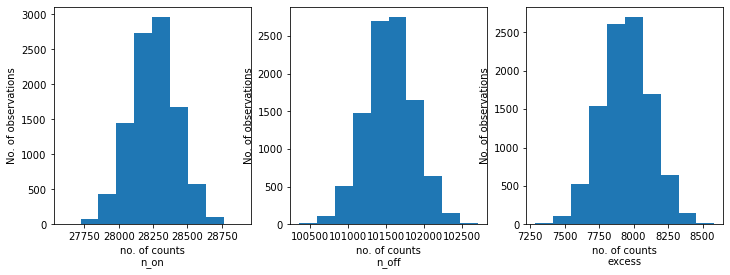

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 55min 54s, sys: 14.2 s, total: 56min 9s
Wall time: 1h 1min 38s


In [15]:
results

[{'index': 2.08918040012255,
  'amplitude': 1.850177104819134e-12,
  'lambda_': 3.673352294360042},
 {'index': 2.246807419011836,
  'amplitude': 1.1098591702415119e-12,
  'lambda_': 2.7334017535608637},
 {'index': 2.106780651085318,
  'amplitude': 1.8190278475372278e-12,
  'lambda_': 3.589715644696545},
 {'index': 2.18563790614877,
  'amplitude': 1.4182434701104837e-12,
  'lambda_': 3.2199238719446983},
 {'index': 2.2335082148813235,
  'amplitude': 1.3108606151084685e-12,
  'lambda_': 3.0577825796166618},
 {'index': 2.2509457037855745,
  'amplitude': 1.1846104974806104e-12,
  'lambda_': 2.89042551828439},
 {'index': 2.3602379548752186,
  'amplitude': 8.955689341049595e-13,
  'lambda_': 2.5390207352432648},
 {'index': 2.0765373734656976,
  'amplitude': 1.9857797497104225e-12,
  'lambda_': 3.76726993622788},
 {'index': 2.2878256000698376,
  'amplitude': 1.0410776552645376e-12,
  'lambda_': 2.7678322508808515},
 {'index': 2.283895763951333,
  'amplitude': 1.0408090689897587e-12,
  'lambda

index: 2.2174499700100014 += 0.07829238542631994


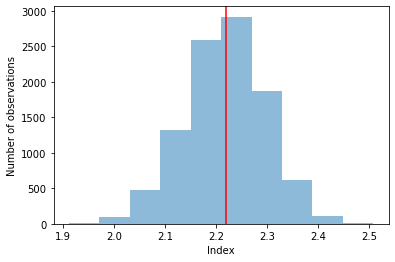

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.3330920976921577e-12 += 3.1348240194980447e-13


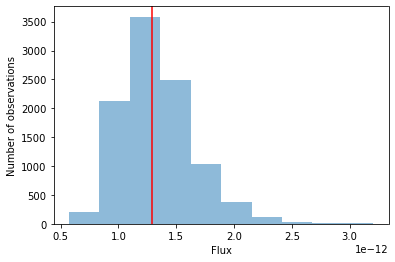

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 3.0179044461069733 += 0.4044837296440243


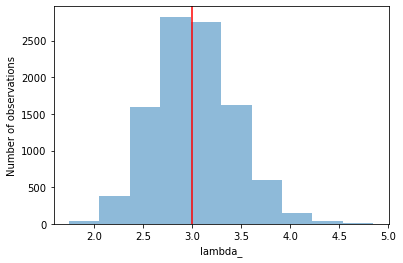

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")